# Procesamiento de un interferograma con topsApp.py

En este sección, daremos una revisión de los pasos del procesamiento de un interferograma usando `topsApp.py`. 

`topsApp.py` es un procesador interferométrico par por par que toma como entrada dos adquisiciones Sentinel-1 SAR en modo TOPS. topsApp.py no funcionará para otros formatos de adquisición Sentinel-1 como Stripmap. Para Stripmap, se debe usar `stripmapApp.py` que es compatible con el procesamiento de mapas interferométricos de Sentinel-1 y otros sensores. En este momento, topsApp solo admite datos SLC de Sentinel-1 A y B. El procesamiento se admite en toda la constelación de Sentinel-1, es decir, los datos adquiridos de A y B se pueden combinar.

Para ilustrar el uso de `topsApp.py`, utilizaremos un conjunto de datos Sentinel-1 que captura la deformación de la superficie como resultado del terremoto del 15 de mayo de 2020 Mw6.5 Monte Cristo Range que ocurrió en Nevada [(detalles aquí)](https://en.wikipedia.org/wiki/2020_Nevada_earthquake). El ejercicio ejecuta el flujo de trabajo paso a paso para generar un interferograma geocodificado.

## 0.- Configuración inicial

Para el desarrollo de esta sección, utilizaremos la siguiente estructura de directorios

```
.
├── Interferograma_topsApp.ipynb    (Este cuaderno)
├── insar                           (Aquí es donde procesaremos el interferograma)
├── support_docs                    (Documentos utilizados en este cuaderno)
└── datos                           (Aquí es donde descargaremos los datos para este portátil)
```

La siguiente celda realiza la configuración inicial y debe ejecutarse cada vez que se utiliza el notebook. Es posible completar parcialmente el ejercicio, cerrar la computadora y volver, y continuar más tarde desde ese punto, pero esta inicialización debe volver a ejecutarse antes de reiniciar. La inicialización define las ubicaciones de procesamiento, así como algunas rutinas de trazado que se utilizarán a lo largo del tutorial, y esta información se pierde cuando se cierra el cuaderno.

In [18]:
from shutil import copyfile, move # Utilidades para copiar y mover archivos
from osgeo import gdal            # Soporte GDAL para leer archivos virtuales
import os                         # Para crear y eliminar directorios
import matplotlib.pyplot as plt   # Para graficar
import numpy as np                # Cálculos de matrices
import glob                       # Recuperando lista de archivos
import boto3                      # Para hablar con el cubo s3

# directorio en el que reside el portátil
if 'tutorial_home_dir' not in globals():
    tutorial_home_dir = os.getcwd()
print("Directorio del notebook: ", tutorial_home_dir)

# directorio para descargas de datos
slc_dir = os.path.join(tutorial_home_dir,'data', 'slcs')
orbit_dir = os.path.join(tutorial_home_dir, 'data', 'orbits')
insar_dir = os.path.join(tutorial_home_dir, 'insar')


# definición de directorios de respaldo en caso de problemas de descarga en el servidor local
s3 = boto3.resource("s3")
data_backup_bucket = s3.Bucket("asf-jupyter-data")
data_backup_dir = "TOPS"

# generar todas las carpetas en caso de que aún no existan
os.makedirs(slc_dir, exist_ok=True)
os.makedirs(orbit_dir, exist_ok=True)
os.makedirs(insar_dir, exist_ok=True)

# Comience siempre en el directorio del notebook  
os.chdir(tutorial_home_dir)

# Utilidad para copiar datos de
def copy_from_bucket(file_in_bucket, dest_file,
                    bucket=data_backup_bucket):
    if os.path.exists(dest_file):
        print("Destination file {0} already exists. Skipping download...".format(dest_file))
    else:
        bucket.download_file(file_in_bucket, dest_file)

# Utilidad para graficar una matriz 2D
def plotdata(GDALfilename, band=1,
             title=None,colormap='gray',
             aspect=1, background=None,
             datamin=None, datamax=None,
             interpolation='nearest',
             nodata = None,
             draw_colorbar=True, colorbar_orientation="horizontal"):
    # Leer los datos en una matriz
    ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
    data = ds.GetRasterBand(band).ReadAsArray()
    transform = ds.GetGeoTransform()
    ds = None
    try:
        if nodata is not None:
            data[data == nodata] = np.nan
    except:
        pass
    # obteniendo el min max de los ejes
    firstx = transform[0]
    firsty = transform[3]
    deltay = transform[5]
    deltax = transform[1]
    lastx = firstx+data.shape[1]*deltax
    lasty = firsty+data.shape[0]*deltay
    ymin = np.min([lasty,firsty])
    ymax = np.max([lasty,firsty])
    xmin = np.min([lastx,firstx])
    xmax = np.max([lastx,firstx])
    # poner todos los valores cero en nan y no trazar nan
    if background is None:
        try:
            data[data==0]=np.nan
        except:
            pass
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(111)
    cax = ax.imshow(data, vmin = datamin, vmax=datamax,
                    cmap=colormap, extent=[xmin,xmax,ymin,ymax],
                    interpolation=interpolation)
    ax.set_title(title)
    if draw_colorbar is not None:
        cbar = fig.colorbar(cax,orientation=colorbar_orientation)
    ax.set_aspect(aspect)    
    plt.show()
    # borrando los datos
    data = None

# Utilidad para trazar interferogramas
def plotcomplexdata(GDALfilename,
                    title=None, aspect=1,
                    datamin=None, datamax=None,
                    interpolation='nearest',
                    draw_colorbar=None, colorbar_orientation="horizontal"):
    # Cargue los datos en una matriz numpy
    ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
    slc = ds.GetRasterBand(1).ReadAsArray()
    transform = ds.GetGeoTransform()
    ds = None
    # obteniendo el min max de los ejes
    firstx = transform[0]
    firsty = transform[3]
    deltay = transform[5]
    deltax = transform[1]
    lastx = firstx+slc.shape[1]*deltax
    lasty = firsty+slc.shape[0]*deltay
    ymin = np.min([lasty,firsty])
    ymax = np.max([lasty,firsty])
    xmin = np.min([lastx,firstx])
    xmax = np.max([lastx,firstx])
    # poner todos los valores cero en nan y no trazar nan
    try:
        slc[slc==0]=np.nan
    except:
        pass
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(1,2,1)
    cax1=ax.imshow(np.abs(slc), vmin = datamin, vmax=datamax,
                   cmap='gray', extent=[xmin,xmax,ymin,ymax],
                   interpolation=interpolation)
    ax.set_title(title + " (amplitude)")
    if draw_colorbar is not None:
        cbar1 = fig.colorbar(cax1,orientation=colorbar_orientation)
    ax.set_aspect(aspect)

    ax = fig.add_subplot(1,2,2)
    cax2 =ax.imshow(np.angle(slc), cmap='rainbow',
                    vmin=-np.pi, vmax=np.pi,
                    extent=[xmin,xmax,ymin,ymax],
                    interpolation=interpolation)
    ax.set_title(title + " (phase [rad])")
    if draw_colorbar is not None:
        cbar2 = fig.colorbar(cax2, orientation=colorbar_orientation)
    ax.set_aspect(aspect)
    plt.show()
    # borrando los datos
    slc = None

# Utilidad para trazar múltiples matrices similares
def plotstackdata(GDALfilename_wildcard, band=1,
                  title=None, colormap='gray',
                  aspect=1, datamin=None, datamax=None,
                  interpolation='nearest',
                  draw_colorbar=True, colorbar_orientation="horizontal"):
    # obtener una lista de todos los archivos que coincidan con los criterios de comodín de nombre de archivo
    GDALfilenames = glob.glob(GDALfilename_wildcard)
    # inicializar matriz numpy vacía
    data = None
    for GDALfilename in GDALfilenames:
        ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
        data_temp = ds.GetRasterBand(band).ReadAsArray()   
        ds = None
        if data is None:
            data = data_temp
        else:
            data = np.vstack((data,data_temp))
    # poner todos los valores cero en nan y no trazar nan
    try:
        data[data==0]=np.nan
    except:
        pass            
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(111)
    cax = ax.imshow(data, vmin = datamin, vmax=datamax,
                    cmap=colormap, interpolation=interpolation)
    ax.set_title(title)
    if draw_colorbar is not None:
        cbar = fig.colorbar(cax,orientation=colorbar_orientation)
    ax.set_aspect(aspect)    
    plt.show() 
    # borrando los datos
    data = None

# Utilidad para trazar múltiples matrices complejas simples
def plotstackcomplexdata(GDALfilename_wildcard,
                         title=None, aspect=1,
                         datamin=None, datamax=None,
                         interpolation='nearest',
                         draw_colorbar=True, colorbar_orientation="horizontal"):
    # obtener una lista de todos los archivos que coincidan con los criterios de comodín de nombre de archivo
    GDALfilenames = glob.glob(GDALfilename_wildcard)
    print(GDALfilenames)
    # inicializar matriz numpy vacía
    data = None
    for GDALfilename in GDALfilenames:
        ds = gdal.Open(GDALfilename, gdal.GA_ReadOnly)
        data_temp = ds.GetRasterBand(1).ReadAsArray()
        ds = None
        if data is None:
            data = data_temp
        else:
            data = np.vstack((data,data_temp))
    # poner todos los valores cero en nan y no trazar nan
    try:
        data[data==0]=np.nan
    except:
        pass              
            
    fig = plt.figure(figsize=(18, 16))
    ax = fig.add_subplot(1,2,1)
    cax1=ax.imshow(np.abs(data), vmin=datamin, vmax=datamax,
                   cmap='gray', interpolation='nearest')
    ax.set_title(title + " (amplitude)")
    if draw_colorbar is not None:
        cbar1 = fig.colorbar(cax1,orientation=colorbar_orientation)
    ax.set_aspect(aspect)

    ax = fig.add_subplot(1,2,2)
    cax2 =ax.imshow(np.angle(data), cmap='rainbow',
                            interpolation='nearest')
    ax.set_title(title + " (phase [rad])")
    if draw_colorbar is not None:
        cbar2 = fig.colorbar(cax2,orientation=colorbar_orientation)
    ax.set_aspect(aspect)
    plt.show() 
    # borrando los datos
    data = None


Directorio del notebook:  /Users/javjrg/Library/CloudStorage/OneDrive-Personal/Proyectos/Gits/InSAR/Notebooks/InSAR


## 1.- Descripción general del conjunto de datos de entrada del tutorial

Primero miremos el conjunto de datos. Para nuestro conjunto de datos, nos estamos enfocando en la pista descendente y las fechas de adquisición del 2020-05-11 y 2020-05-17.

Se puede encontrar más información sobre el evento en la página de terremotos de Monte Cristo Range de USGS [aquí](https://earthquake.usgs.gov/earthquakes/eventpage/nn00725272/executive)

Puede ver las escenas de interés en la página Vertex de ASF [aquí](https://search.asf.alaska.edu/#/?zoom=6.9117542264702365&center=-117.963049,38.048229&polygon=POLYGON((-118.2093%2038.0347,-117.6875%2038.0347,-117.6875%2038.3268,-118.2093%2038.3268,-118.2093%2038.0347))&path=71-71&start=2020-05-11T00:00:00Z&end=2020-05-17T23:59:00Z&productTypes=SLC&resultsLoaded=true)

El área de interés es capturada por un solo SLC en cada pasada y las usaremos en este tutorial. Incluso, si el evento ocurriera en un límite de la imagen, todo lo que tendría que hacer es descargar los múltiples SLC en la misma pista y `topsApp.py` los procesará y creará un mosaico por usted.

### 1.1 Antecedentes del modo TOPS

La estrategia de adquisición de TOPS es diferente al modo stripmap convencional. TOPS significa (por si sigla en inglés) Observación del Terreno con Escaneos Progresivos. Como su nombre lo indica, el sensor de radar realiza un escaneo de la superficie dirigiendo electrónicamente el haz de la antena desde una dirección a lo largo de la trayectoria que apunta hacia atrás a una dirección a lo largo de la trayectoria que apunta hacia adelante para una franja de rango fijo (también llamada sub-franja).

<div>
<p style = 'text-align:center;'>
<img src="modo_tops.png" alt="Método TOPS" width="500px">
</p>
</div>

Después de un escaneo exitoso en esa extensión de rango, el haz de la antena retrocede electrónicamente a su posición inicial, la franja de rango se dirige electrónicamente hacia afuera a una nueva área para aumentar la cobertura, y el siguiente escaneo se realiza de atrás hacia adelante a lo largo de la pista en este franja de rango nuevo. Después de un tercer escaneo en una franja de tercer rango, todo el proceso se repite una y otra vez para crear una imagen continua a medida que el satélite vuela. El momento de los escaneos es tal que existe una pequeña superposición geográfica entre escaneos sucesivos en un rango determinado para garantizar una cobertura continua. Cada escaneo en una franja de rango dada se conoce como "ráfaga". Al inspeccionar uno de los productos SLC descargados, notará que los datos se proporcionan en 3 subsectores individuales (IW1, IW2, IW3), cada uno con un conjunto de ráfagas. Todos juntos forman un marco Sentinel-1, típicamente de ~250 x 250 km de tamaño. Las ráfagas tienen una longitud aproximada de 20 km y se superponen 2 km. Debido al modo de adquisición TOPS, la región de superposición en ráfagas sucesivas se ve desde dos direcciones diferentes (mirando hacia adelante y mirando hacia atrás).

<div>
<p style = 'text-align:center;'>
<img src="tops.png" alt="TOPS" width="500px">
</p>
</div>

El sitio web de la ESA proporciona información básica detallada sobre los productos Sentinel-1 e información técnica de los sensores TOPS [(detalles aquí)](https://sentinel.esa.int/web/sentinel/user-guides/sentinel-1-sar).

### 1.2 SLC download

La página de ASF [(link)](https://www.asf.alaska.edu/sentinel/) ofrece una GUI para buscar visualmente los datos de Sentinel-1 disponibles en su área de interés. Una vez que haya encontrado sus datos, puede descargarlos desde la GUI. ASF proporciona un script Python de descarga masiva.

A continuación, incluimos una pequeña secuencia de comandos de Python para descargar los datos que le permite analizar directamente su contraseña y nombre de usuario en la parte superior de la función (esto llevará unos minutos para cada archivo).

In [9]:
# Actualice esto con su inicio de sesión de NASA Earthdata para descargar datos SLC
ASF_USER = "user"
ASF_PASS = "pass"

files = ['https://datapool.asf.alaska.edu/SLC/SA/S1A_IW_SLC__1SDV_20200511T135117_20200511T135144_032518_03C421_7768.zip',
         'https://datapool.asf.alaska.edu/SLC/SB/S1B_IW_SLC__1SDV_20200517T135026_20200517T135056_021622_0290CB_99E2.zip']
         
if len(ASF_USER)==0 or len(ASF_PASS)==0:
    raise Exception("Especifique su contraseña y usuario de ASF (inicio de sesión de Earthdata)")
    
for file in files:
    filename = os.path.basename(file)
    
    if not os.path.exists(os.path.join(slc_dir,filename)):
        cmd = "wget {0} --user={1} --password={2} -P {3} -nc".format(file, ASF_USER, ASF_PASS, slc_dir)
        print(cmd)
        os.system(cmd)
    else:
        print(filename + " ya existe. Saltando descarga...")

S1A_IW_SLC__1SDV_20200511T135117_20200511T135144_032518_03C421_7768.zip ya existe. Saltando descarga...
S1B_IW_SLC__1SDV_20200517T135026_20200517T135056_021622_0290CB_99E2.zip ya existe. Saltando descarga...


El tamaño de los archivos es de más de 4 GB cada uno.

In [10]:
! ls -lh {slc_dir}

total 18118856
-rw-r--r--  1 javjrg  staff   4.1G May 11  2020 S1A_IW_SLC__1SDV_20200511T135117_20200511T135144_032518_03C421_7768.zip
-rw-r--r--  1 javjrg  staff   4.5G May 18  2020 S1B_IW_SLC__1SDV_20200517T135026_20200517T135056_021622_0290CB_99E2.zip


#### 1.2.2 Establecer/restablecer al directorio de inicio

Este paso es necesario cada vez que se reinicia la computadora portátil y se omite la descarga de slc. También se puede ejecutar en la ejecución inicial, aunque no es necesario ya que el directorio se reinicia durante el proceso de descarga de slc.

In [11]:
os.chdir(tutorial_home_dir)

In [12]:
!ls -lh {slc_dir}

total 18118856
-rw-r--r--  1 javjrg  staff   4.1G May 11  2020 S1A_IW_SLC__1SDV_20200511T135117_20200511T135144_032518_03C421_7768.zip
-rw-r--r--  1 javjrg  staff   4.5G May 18  2020 S1B_IW_SLC__1SDV_20200517T135026_20200517T135056_021622_0290CB_99E2.zip


### 1.3 Convención de nomenclatura de archivos SLC

Los archivos de productos TOPS SLC entregados desde ESA son archivos zip. Cuando se desempaque, la extensión zip será reemplazada por SAFE. Por lo tanto, los productos también se denominan con frecuencia archivos SAFE. `topsApp.py` puede leer los datos desde un archivo zip o un archivo SAFE. Para limitar el uso del disco, se recomienda no descomprimir los archivos individuales.

Los nombres de archivo zip o SAFE proporcionan información sobre el tipo de producto, la polarización y el tiempo de adquisición de inicio y finalización. Por ejemplo: S1A_IW_SLC__1SDV_20200511T135117_20200511T135144_032518_03C421_7768.zip
- Tipo = slc
- Polarización = Doble polarización
- Fecha = 20200511
- Hora UTC de adquisición = ~13:51
- El inicio de detección para la adquisición fue 20200511 a las 13:51:17


### 1.4 Descarga de órbitas

Además de los **archivos SAFE**, se requieren **archivos de órbita** y **archivos de instrumentos auxiliares** para el procesamiento ISCE. La ESA proporciona los archivos de órbita e instrumentos y se pueden descargar en: https://qc.sentinel1.eo.esa.int/.

In [13]:
os.chdir(tutorial_home_dir)

In [24]:
!ls {orbit_dir}

S1A_OPER_AUX_POEORB_OPOD_20200531T120757_V20200510T225942_20200512T005942.EOF
S1B_OPER_AUX_POEORB_OPOD_20200606T110735_V20200516T225942_20200518T005942.EOF


Aunque las órbitas restituidas de Sentinel-1 (RESORB) son de buena calidad, se recomienda utilizar las órbitas precisas (POEORB) cuando estén disponibles. Por lo general, las órbitas precisas están disponibles con un retraso de 15 a 20 días desde el día de la adquisición.

### 1.5 Archivo de calibración del instrumento

Los SLC Sentinel-1 suelen ser productos bien calibrados y, en general, no tenemos que lidiar con la lectura de archivos de calibración de instrumentos. Una excepción son los SLC generados con **IPF versión 002.36**. Sin embargo, la cantidad de SLC de este tipo está muy por debajo del 0,5 % de los datos y solo afecta los datos anteriores a la misión en 2015. No necesitamos estos archivos para nuestro conjunto de datos.

## 2. topsApp.py variables de entrada

Al igual que las otras aplicaciones de ISCE, las variables de entrada de `topsApp.py` se controlan a través de un archivo xml de la aplicación. Todas las aplicaciones en ISCE tienen archivos xml de ejemplo incluidos en la distribución de ISCE. Puede encontrarlos en [**examples/input_files**](https://github.com/isce-framework/isce2/tree/main/examples/input_files) en el repositorio de github. Para mayor comodidad, hemos incluido el ejemplo *topsApp.xml* y *reference_TOPS_SENTINEL1.xml* en la carpeta support_docs.

### 2.1 Entradas topsApp.py requeridas versus opcionales

El ejemplo *topsApp.xml* contiene todas las variables de entrada con una descripción. Primero leamos este archivo. Puede abrir el archivo iniciando una **terminal** y usando su editor preferido para abrir el archivo. Para el tipo vim:
```
     vim support_docs/example/topsApp.xml
     vim support_docs/example/reference_TOPS_SENTINEL1.xml
```
Cuando se trata del procesamiento real con topsApp.py, no necesita especificar todas las variables de entrada como se muestra en el ejemplo topsApp.xml. Se asumirán los valores predeterminados cuando el usuario no establezca las propiedades. Puede obtener una descripción general de la tabla simple de las variables requeridas llamando a la ayuda de topsApp.py.

In [25]:
!python $ISCE_HOME/applications/topsApp.py --help

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-19 17:15:00,978 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
None
The currently supported sensors are:  ['SENTINEL1']

Usages: 
topsApp.py <input-file.xml>
topsApp.py --steps
topsApp.py --help
topsApp.py --help --steps


See the table of configurable parameters listed 
below for a list of parameters that may be specified in the
input file.  See example input xml files in the isce 'examples'
directory.

En la tabla, puede ver que se deben especificar los componentes **reference** y **secondary**. Esto se puede hacer directamente con sus propiedades específicas en topsApp.xml o, alternativamente, se puede apuntar a un archivo xml dedicado para la **reference** y **secondary**, cada uno de los cuales contiene sus propiedades individuales. Las propiedades requeridas para la referencia y secundaria deben incluir al menos información de órbita como "directorio de órbita" y una lista de productos bajo la etiqueta de propiedad "safe".

<br>
<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
Si especifica una **región de interés**, asegúrese de que cubra al menos dos ráfagas. Si este no es el caso, ESD fallará en el procesamiento ya que se estima a partir de la región de superposición de ráfagas. Siempre puede decidir geocodificar solo una región más pequeña con la propiedad ** **.
</div>

### 2.2 Entradas de topsApp para esta sección

Examinemos ahora los archivos *topsApp.xml*, *reference.xml* y *secondary.xml* que se utilizarán para esta sección

#### 2.2.1 topsApp.xml

```xml
<?xml version="1.0" encoding="UTF-8"?>
<topsApp>
  <component name="topsinsar">
    <property name="Sensor name">SENTINEL1</property>
    <component name="reference">
        <catalog>reference.xml</catalog>
    </component>
    <component name="secondary">
        <catalog>secondary.xml</catalog>
    </component>
    <property name="swaths">[3]</property>
    <property name="range looks">7</property>
    <property name="azimuth looks">3</property>
    <property name="region of interest">[37.98, 38.33, -118.21, -117.68]</property>
    <property name="do unwrap">True</property>
    <property name="unwrapper name">snaphu_mcf</property>
    <property name="do denseoffsets">True</property>
      <!--<property name="demfilename">path_to_your_dem</property>-->
      <!--<property name="geocode demfilename">path_to_your_dem</property>-->
    <!--property name="geocode list">['merged/phsig.cor', 'merged/filt_topophase.unw', 'merged/los.rdr', 'merged/topophase.flat', 'merged/filt_topophase.flat','merged/topophase.cor','merged/filt_topophase.unw.conncomp']</property>-->
  </component>
</topsApp>
```


- Los componentes de referencia y secundarios se refieren a sus propios archivos *.xml*
- La propiedad **swaths** controla el número de franjas que se procesarán. Como el terremoto ocurrió en la subfranja tres, podemos limitar directamente la lista a la lista de entrada [3] únicamente.
- Especificamos que **range looks** y **azimuth looks** sean 7 y 3. La resolución de alcance para sentinel varía de cerca a lejos, pero es de aproximadamente 5 m, mientras que la resolución de acimut es de aproximadamente 15 m, lo que lleva a un producto de aspecto múltiple que tendrá aproximadamente 35 m por 45 m.
- Al especificar la **región de interés** como [S, N, W, E] para capturar solo la extensión del terremoto, `topsApp.py` solo extraerá las ráfagas de la subfranja 3 necesarias para cubrir el terremoto.
- De forma predeterminada, `topsApp.py` puede descargar un DEM sobre la marcha. Al incluir **demFilename**, se puede especificar un DEM local como entrada para el procesamiento. Para este ejercicio, se proporciona una muestra de DEM de 1 segundo de arco en WGS84 en la carpeta DEM/DEM1.
- De forma predeterminada, la geocodificación en `topsApp.py` se realiza en el mismo muestreo que el procesamiento de DEM. Sin embargo, se puede especificar un DEM *diferente que se usará específicamente para geocodificación* mediante la propiedad **geocode demfilename**. Esto se usa para el caso en que los datos se han buscado en múltiples ordenes de 100m o más y cuando la geocodificación a 30m es una exageración.
- De forma predeterminada, no se realiza ningún desenrollado. Para activarlo, establezca la propiedad **do unwrap** en *True*.
- En caso de que se solicite el desenrollado, la estrategia de desempaquetado por defecto que se aplicará es el método de desempaquetado *icu*. Para este tutorial, usaremos *snaphu_mcf*.
- Por último, solicitamos `topsApp.py` para ejecutar las compensaciones densas utilizando la propiedad **do denseoffsets**. Al habilitar esto, `topsApp.py` estimará las compensaciones de rango y azimut en la amplitud de los archivos SLC de referencia y secundarios.


Verá que algunas de las propiedades anteriores están comentadas en los archivos xml provistos. Volveremos a estos más adelante en la sección. Las propiedades comentadas tienen la forma:
```xml
<!--<property> ... </property>--> 
```

#### 2.2.2 reference.xml and secondary.xml

**reference.xml**
``` xml
<component name="reference">
    <property name="orbit directory">../data/orbits</property>
    <property name="output directory">reference</property>
    <property name="safe">['../data/slcs/S1A_IW_SLC__1SDV_20200511T135117_20200511T135144_032518_03C421_7768.zip']</property>
</component>
```

**secondary.xml**
``` xml
<component name="secondary">
    <property name="orbit directory">../data/orbits</property>
    <property name="output directory">secondary</property>
    <property name="safe">['../data/slcs/S1B_IW_SLC__1SDV_20200517T135026_20200517T135056_021622_0290CB_99E2.zip']</property>
</component>
```

- El valor asociado a la propiedad de referencia **safe** corresponde a una lista de archivos SAFE que se van a mosaico al generar el interferograma.
- El **orbit directory** apunta al directorio donde hemos almacenado las órbitas POEORB (precisas) para este ejemplo.


<br>
<div class="alerta alerta-advertencia">
<b>CONVENCIÓN DE SIGNO:</b>
Seleccionando el secundario para que sea el adquirido después de la referencia, y teniendo en cuenta que la formación del interferograma es reference*conj(secundary), entonces un valor de fase positivo para el interferograma indica que la superficie se ha movido hacia el satélite entre 2020-05- 11 y 2020-05-17.
</div>


## 3. Pasos de procesamiento de topsApp.py

El flujo de trabajo topsApp.py se puede ejecutar con una sola llamada de línea de comando a `topsApp.py`; de forma predeterminada, ejecutará todos los pasos de procesamiento requeridos con entradas extraídas del archivo `topsApp.xml`. Aunque esta es una característica atractiva, se recomienda ejecutar `topsApp.py` con los "pasos" habilitados. Esto le permitirá reiniciar el procesamiento desde un paso de procesamiento determinado. Si no se utilizan "pasos", los usuarios deben reiniciar el procesamiento desde el principio del flujo de trabajo después de solucionar cualquier problema posterior con el procesamiento.

La opción "--help" enumera todos los pasos involucrados en el procesamiento:

In [1]:
!python $ISCE_HOME/applications/topsApp.py --help --steps

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-20 10:37:44,385 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
None
The currently supported sensors are:  ['SENTINEL1']

Usages: 
topsApp.py <input-file.xml>
topsApp.py --steps
topsApp.py --help
topsApp.py --help --steps

None
A description of the individual steps can be found in the README file
and also in the ISCE.pdf document

Command line options for steps processing are formed by
combining the foll

<br>
<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
**Los pasos deben ejecutarse en el siguiente orden prescrito**:
*<center>
['startup', 'preprocess', 'computeBaselines', 'verifyDEM', 'topo']
['subsetoverlaps', 'coarseoffsets', 'coarseresamp', 'overlapifg', 'prepesd']
['esd', 'rangecoreg', 'fineoffsets', 'fineresamp', 'burstifg']
['mergebursts', 'filter', 'unwrap', 'unwrap2stage', 'geocode']
['denseoffsets', 'filteroffsets', 'geocodeoffsets']
</center>*
</div>


### 3.0 Configuración del directorio

Antes de comenzar el procesamiento paso a paso con `topsApp.py`, primero configuramos el directorio de procesamiento denominado **insar** y copiamos el archivo de plantilla `topsApp.xml` (*ls support_docs/insar/topsApp.xml*) en la ubicación de procesamiento.

In [6]:
## Plantilla xml para este tutorial
topsAppXml_original =  os.path.join(tutorial_home_dir,'support_docs/insar/topsApp.xml')  
refXml_original =  os.path.join(tutorial_home_dir,'support_docs/insar/reference.xml')  
secXml_original =  os.path.join(tutorial_home_dir,'support_docs/insar/secondary.xml')  


## Compruebe si el archivo topsApp.xml ya existe; si no, copie el ejemplo para el ejercicio.
if not os.path.isfile(os.path.join(insar_dir,'topsApp.xml')):
    copyfile(topsAppXml_original, os.path.join(insar_dir, 'topsApp.xml'))
else:
    print(os.path.join(insar_dir,'topsApp.xml') + " ya existe, no se sobrescribirá")
    
if not os.path.isfile(os.path.join(insar_dir, 'reference.xml')):
    copyfile(refXml_original, os.path.join(insar_dir,'reference.xml'))
else:
    print(os.path.join(insar_dir,'reference.xml') + " ya existe, no se sobrescribirá")
    
if not os.path.isfile(os.path.join(insar_dir, 'secondary.xml')):
    copyfile(secXml_original,os.path.join(insar_dir, 'secondary.xml'))
else:
    print(os.path.join(insar_dir,'secondary.xml') + " ya existe, no se sobrescribirá")

/Users/javjrg/Library/CloudStorage/OneDrive-Personal/Proyectos/Gits/InSAR/Notebooks/InSAR/insar/topsApp.xml ya existe, no se sobrescribirá
/Users/javjrg/Library/CloudStorage/OneDrive-Personal/Proyectos/Gits/InSAR/Notebooks/InSAR/insar/reference.xml ya existe, no se sobrescribirá
/Users/javjrg/Library/CloudStorage/OneDrive-Personal/Proyectos/Gits/InSAR/Notebooks/InSAR/insar/secondary.xml ya existe, no se sobrescribirá


### 3.1 Resumen rápido de su interferograma

In [8]:
# vamos con "cd" a este directorio donde se realizará el procesamiento.
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --start=startup --end=computeBaselines

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-20 11:19:15,120 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step startup
None
The currently supported sensors are:  ['SENTINEL1']
Dumping the application's pickle object _insar to file  PICKLE/startup
The remaining steps are (in order):  ['preprocess', 'computeBaselines', 'verifyDEM', 'topo', 'subsetoverlaps', 'coarseoffsets', 'coarseresamp', 'overlapifg', 'prepesd', 'esd', 'r

#### 3.1.1 Paso startup

Comenzaremos ejecutando el primer paso **startup**. 

In [9]:
# Descomente si desea ejecutar solo este paso
#!python $ISCE_HOME/applications/topsApp.py --dostep=startup

Cuando `topsApp.py` se ejecuta en pasos, los archivos PICKLE se utilizan para almacenar información de estado entre los pasos. Se crea una carpeta PICKLE durante el paso de inicio. La carpeta PICKLE se utiliza para almacenar los parámetros de procesamiento para cada paso de procesamiento. Al explorar la carpeta pickle, encontrará un archivo pickle binario y un archivo *xml* asociado con el paso de **startup**.

In [10]:
!ls PICKLE

computeBaselines     preprocess           startup
computeBaselines.xml preprocess.xml       startup.xml


La información contenida en los archivos pickle y *xml* de **startup** permite que topsApp inicie o reinicie el procesamiento desde donde se completó el **startup**.

#### 3.1.2 Paso preprocess

Teniendo en cuenta que el orden de los pasos es importante, pasamos al segundo paso del procesamiento de topsApp.py, que consiste en **preprocesar** los datos.

In [20]:
# Descomente si desea ejecutar solo este paso
#!python $ISCE_HOME/applications/topsApp.py --dostep=preprocess

Durante el preprocesamiento, se extraen las órbitas, el IPF (Instalación de procesamiento de instrumentos, que es la versión de procesamiento utilizada por la ESA para enfocar los datos), las ráfagas y, si es necesario, el patrón de la antena.

Tenga en cuenta que si hubiera procesado la región completa sin limitación, habría tres subsectores (IW1,IW2,IW3). Para nuestro ejemplo,
limitamos el procesamiento solo a IW3. Por lo tanto, para nuestro tutorial, dentro de las carpetas secundaria y de referencia encontrará solo una carpeta **IW3** y un archivo **IW3.xml**.

In [11]:
!ls reference/*

reference/IW3.xml

reference/IW3:
burst_01.slc.vrt burst_02.slc.vrt burst_03.slc.vrt burst_04.slc.vrt
burst_01.slc.xml burst_02.slc.xml burst_03.slc.xml burst_04.slc.xml


El archivo **IW3.xml** contiene información de metadatos específica para cada subsegmento (por ejemplo, vectores de estado de órbita, doppler, tiempos de detección, versión IPF). Puede abrir el archivo usando su editor preferido desde la línea de comando:
```
    referencia vim/IW3.xml
```
La carpeta **IW3** contiene las ráfagas desempaquetadas y sus metadatos.
Por lo general, encontrará archivos *.xml* y *.vrt* y, en ciertos casos, archivos *.slc*, como se describe a continuación.
- Si se especifica un cuadro delimitador, solo se descomprimen las ráfagas de referencia que cubren el cuadro; de lo contrario, se utiliza el SLC de referencia completo. Las ráfagas de la referencia en reference/IW* se vuelven a etiquetar de 1 a n.
- Las carpetas secondary/IW* normalmente contienen un conjunto más grande de ráfagas para cubrir completamente la extensión de referencia, donde las ráfagas se etiquetan de 1 a m. La numeración de las ráfagas no está coordinada entre las carpetas de referencia y secundaria: la ráfaga 1 en la referencia no se corresponde necesariamente con la ráfaga 1 en la secundaria.
- Todos los datos se desempaquetan virtualmente (es decir, solo los archivos *.xml* y *.vrt* en las carpetas *IW*) a menos que: (1) el usuario solicite desempaquetar físicamente los datos, que se puede solicitar en topsApp.xml por propiedad **usevirtualfiles**, o (2) si es necesario aplicar una corrección de patrón de antena (no controlada por el usuario), lo que sucede principalmente para los datos de Sentinel-1 adquiridos inicialmente.
- Se realiza un seguimiento de la versión IPF de las ráfagas desempaquetadas y se asigna un IPF combinado para la referencia y otro para el secundario. Nota: las ráfagas procesadas con diferentes versiones de IPF no se pueden combinar y, al intentar hacerlo, aparecerá un mensaje de error.

<br>
<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
Hay una brecha en la cobertura espacial, por ejemplo le falta el archivo SAFE del medio.
</div>
<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
Los marcos SAFE que necesitan ser pegados no tienen una versión IPF consistente
</div>

#### 3.1.3 Calcular líneas de base por pasos

In [22]:
# Descomente si desea ejecutar solo este paso
#!python $ISCE_HOME/applications/topsApp.py --dostep=computeBaselines

En este paso, las líneas base perpendiculares y paralelas se calculan usando la órbita (información del vector de estado) para la primera y última ráfaga de la imagen de referencia (rango central). Cada subsegmento se procesa individualmente y la salida se envía a la pantalla. Como el procesamiento del tutorial se limita a IW3, las líneas base solo se calculan para esta subsegmentación.

### 3.2 Paso verifyDEM

In [2]:
# vamos con "cd" a este directorio donde se realizará el procesamiento.
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --dostep=verifyDEM

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-20 16:51:45,578 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step verifyDEM
Dumping the application's pickle object _insar to file  PICKLE/verifyDEM
The remaining steps are (in order):  ['topo', 'subsetoverlaps', 'coarseoffsets', 'coarseresamp', 'overlapifg', 'prepesd', 'esd', 'rangecoreg', 'fineoffsets', 'fineresamp', 'ion', 'burstifg', 'mergebursts', 'filter', 'unwrap', 'unwr

Este paso verificará el archivo DEM especificado en *topsApp.xml*. Si no se ha especificado ningún archivo DEM, topsApp.py descargará el DEM sobre la marcha y rastreará el nombre del archivo para su procesamiento posterior.

<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
No configuró sus credenciales de datos terrestres como se detalla en la instalación de ISCE. Encuentre instrucciones aquí: [Paso 2 aquí](https://wiki.earthdata.nasa.gov/display/EL/How+To+Access+Data+With+cURL+And+Wget)
</div>

<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
Configuró sus credenciales de datos terrestres como se detalla en la instalación de ISCE, pero tiene caracteres especiales en su contraseña. "Escapar" de estos caracteres agregando una barra invertida delante de ellos.
</div>

<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
El sitio ftp DEM está inactivo y no devuelve mosaicos de datos.
</div>


#### SOLO si falla la descarga

Si la descarga de DEM falló y no puede resolver el problema, puede usar el DEM proporcionado con este tutorial. Esto requiere tres pasos para completar, antes de que pueda volver a ejecutar el paso **verifyDEM**:

1) Copie el DEM de la carpeta de respaldo a su ubicación de procesamiento

In [17]:
files = ['demLat_N37_N39_Lon_W119_W117.dem.wgs84',       #Ráster binario
         'demLat_N37_N39_Lon_W119_W117.dem.wgs84.xml',   #XML requerido por ISCE
         'demLat_N37_N39_Lon_W119_W117.dem.wgs84.vrt']   #VRT equerido por ISCE
for file in files:
    if not os.path.exists(os.path.join(insar_dir,file)):
        copy_from_bucket(os.path.join("TOPS",file),
                 os.path.join(insar_dir,file))
        print(file + " done")
    else:
        print(file + " already exists")

demLat_N37_N39_Lon_W119_W117.dem.wgs84 already exists
demLat_N37_N39_Lon_W119_W117.dem.wgs84.xml already exists
demLat_N37_N39_Lon_W119_W117.dem.wgs84.vrt already exists


2) Para usar este DEM, deberá editar el archivo **topsApp.xml** y descomentar la propiedad para **demFilename**.
``` vim
    vim insar/topsApp.xml
```
Recuerde las pautas *xml*:
```xml
<!--<property> ..COMMENTED.. </property>--> 
<property> ..UNCOMMENTED.. </property>
```

Ahora vuelva a ejecutar el paso **verifyDEM** para asegurarse de que la nueva información DEM se cargue correctamente en el procesamiento:

In [18]:
!python $ISCE_HOME/applications/topsApp.py --dostep=verifyDEM

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-20 11:50:01,290 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step verifyDEM
Dumping the application's pickle object _insar to file  PICKLE/verifyDEM
The remaining steps are (in order):  ['topo', 'subsetoverlaps', 'coarseoffsets', 'coarseresamp', 'overlapifg', 'prepesd', 'esd', 'rangecoreg', 'fineoffsets', 'fineresamp', 'ion', 'burstifg', 'mergebursts', 'filter', 'unwrap', 'unwr

### 3.3 Paso topo

Durante el procesamiento topográfico, el DEM se asigna a las coordenadas de radar de la imagen de **referencia**. Como salida, esto genera la carpeta **reference_geom** que contiene la longitud (*lon_XX.rdr*), latitud (*lat_XX.rdr*), altura (*hgt_XX.rdr*) y LOS ángulos (*los_XX.rdr*) en una cuadrícula píxel por píxel para cada ráfaga (*XX*). Este paso es el paso que consume más tiempo. Está paralelizado para el rendimiento y también se puede ejecutar con la compatibilidad con GPU habilitada.

Para nuestro tutorial, anticipe que este paso tomará más de 20 minutos.

Esta es una buena oportunidad para familiarizarse un poco más con el modo TOPS y los parámetros de entrada.
- ¿Puede encontrar qué propiedad en topsApp.xml controla el procesamiento de la GPU? Sugerencia: consulta “topsApp.py --help”.
- ¿Puede encontrar el rango de ángulo de incidencia típico para IW3? Sugerencia: puede intentar cargar el archivo los.rdr para obtener una ráfaga o buscar en el sitio web de la ESA la documentación de TOPS.

Una vez completado el paso, puede echar un vistazo a los archivos que se han generado para cada ráfaga:

In [20]:
# vamos con "cd" a este directorio donde se realizará el procesamiento.
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --dostep=topo

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-20 11:56:38,903 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step topo
2022-10-20 11:56:39,538 - isce.zerodop.topozero - WARNING - Default Peg heading set to: -2.9087016070951264
Polynomial Order: 0 - by - 0 
0	
Polynomial Order: 0 - by - 1 
901674	2.32956	
GDAL open (R): demLat_N37_N39_Lon_W119_W117.dem.wgs84.vrt
API open (WR): geom_reference/IW3/lat_01.rdr
API open (WR): geom

In [21]:
ls geom_reference/*

hgt_01.rdr      hgt_04.rdr.vrt  lat_03.rdr.xml  lon_03.rdr      los_02.rdr.vrt
hgt_01.rdr.vrt  hgt_04.rdr.xml  lat_04.rdr      lon_03.rdr.vrt  los_02.rdr.xml
hgt_01.rdr.xml  lat_01.rdr      lat_04.rdr.vrt  lon_03.rdr.xml  los_03.rdr
hgt_02.rdr      lat_01.rdr.vrt  lat_04.rdr.xml  lon_04.rdr      los_03.rdr.vrt
hgt_02.rdr.vrt  lat_01.rdr.xml  lon_01.rdr      lon_04.rdr.vrt  los_03.rdr.xml
hgt_02.rdr.xml  lat_02.rdr      lon_01.rdr.vrt  lon_04.rdr.xml  los_04.rdr
hgt_03.rdr      lat_02.rdr.vrt  lon_01.rdr.xml  los_01.rdr      los_04.rdr.vrt
hgt_03.rdr.vrt  lat_02.rdr.xml  lon_02.rdr      los_01.rdr.vrt  los_04.rdr.xml
hgt_03.rdr.xml  lat_03.rdr      lon_02.rdr.vrt  los_01.rdr.xml
hgt_04.rdr      lat_03.rdr.vrt  lon_02.rdr.xml  los_02.rdr


¿Pudiste calcular el ángulo de incidencia para la subfranja 3? Se trata de 41$^\circ$-46$^\circ$. Esta información está contenida en los archivos *los.XX.rdr*. Su primera banda contiene el ángulo de incidencia y la segunda banda el ángulo azimutal del satélite. Hay una manera fácil de recuperar su valor promedio con GDAL:

In [22]:
!gdalinfo -stats geom_reference/IW3/los_02.rdr.vrt

Driver: VRT/Virtual Raster
Files: geom_reference/IW3/los_02.rdr.vrt
       geom_reference/IW3/los_02.rdr
Size is 24492, 1515
Corner Coordinates:
Upper Left  (    0.0,    0.0)
Lower Left  (    0.0, 1515.0)
Upper Right (24492.0,    0.0)
Lower Right (24492.0, 1515.0)
Center      (12246.0,  757.5)
Band 1 Block=24492x1 Type=Float32, ColorInterp=Undefined
  Minimum=41.670, Maximum=46.160, Mean=43.960, StdDev=1.275
  Metadata:
    STATISTICS_MAXIMUM=46.159736633301
    STATISTICS_MEAN=43.960011584421
    STATISTICS_MINIMUM=41.670024871826
    STATISTICS_STDDEV=1.2746222558848
    STATISTICS_VALID_PERCENT=100
Band 2 Block=24492x1 Type=Float32, ColorInterp=Undefined
  Minimum=-99.771, Maximum=-99.170, Mean=-99.468, StdDev=0.170
  Metadata:
    STATISTICS_MAXIMUM=-99.170288085938
    STATISTICS_MEAN=-99.467780397307
    STATISTICS_MINIMUM=-99.770805358887
    STATISTICS_STDDEV=0.17049619035761
    STATISTICS_VALID_PERCENT=100


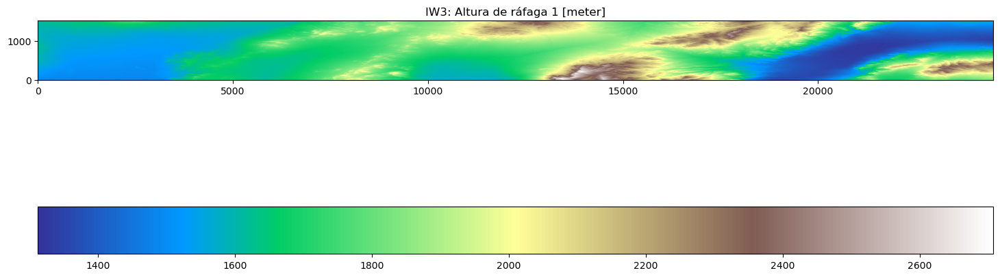

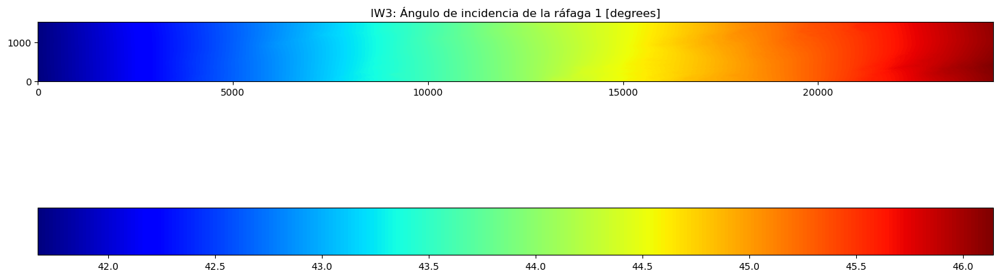

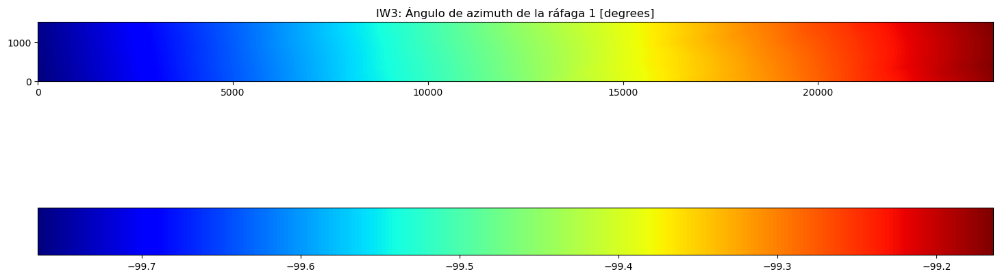

In [24]:
plotdata('geom_reference/IW3/hgt_01.rdr', band=1,
         title='IW3: Altura de ráfaga 1 [meter]',
         colormap='terrain')
plotdata('geom_reference/IW3/los_01.rdr', band=1,
         title='IW3: Ángulo de incidencia de la ráfaga 1 [degrees]',
         colormap='jet')
plotdata('geom_reference/IW3/los_01.rdr', band=2,
         title='IW3: Ángulo de azimuth de la ráfaga 1 [degrees]',
         colormap='jet')

### 3.4 Enhanced spectral diversity (ESD)

In [25]:
# vamos con "cd" a este directorio donde se realizará el procesamiento.
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --start=subsetoverlaps --end=esd

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-20 12:38:20,980 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step subsetoverlaps
Top:  ['reference/overlaps/IW3/burst_top_01_02.slc']
Bottom:  ['reference/overlaps/IW3/burst_bot_01_02.slc']
Top:  ['reference/overlaps/IW3/burst_top_01_02.slc', 'reference/overlaps/IW3/burst_top_02_03.slc']
Bottom:  ['reference/overlaps/IW3/burst_bot_01_02.slc', 'reference/overlaps/IW3/burst_bot_0

#### 3.4.1 Paso subsetoverlaps

Debido a la gran variación de frecuencia doppler inherente al modo de adquisición TOPS, las imágenes compatibles con la interferometría deben estar corregistradas en la dirección del azimuth a más de 0,001 píxeles, en comparación con los datos de mapa de franjas regulares (0,1 de un píxel). Si bien la correlación cruzada convencional de la amplitud funciona para la dirección del rango, no brinda suficiente precisión para el azimuth. La solución es aplicar un enfoque de diversidad espectral mejorada (ESD) para estimar el corregistro de azimuth. En el procesamiento ESD, se realiza un interferograma de doble diferencia entre la **referencia** y el **secundario** en la región de superposición de ráfagas. Como el desplazamiento del rango se cancela, este interferograma solo mostrará el movimiento azimutal. En ausencia de una gran deformación del suelo, este movimiento azimutal puede interpretarse como un desplazamiento de corregistro azimutal.

Los siguientes pasos de procesamiento hasta ESD son específicos solo para las regiones de superposición de ráfagas.

Al ejecutar el paso **subsetoverlaps**, la superposición superior e inferior entre las ráfagas se calcula para la geometría de referencia. Luego, la información se almacena en la carpeta *overlaps* del directorio de referencia.

Tenga en cuenta que la nomenclatura "arriba" y "abajo" puede ser confusa. En este caso, **no** se refiere a la parte superior e inferior de la ráfaga. Se refiere a la ráfaga *n* como "superior" y la ráfaga *n+1* como "inferior", visualizándola como la imagen anterior colocada encima de la imagen posterior, que está en la parte inferior. 

<div>
<p style = 'text-align:center;'>
<img src="esd.png" alt="TOPS" width="500px">
</p>
</div>

In [31]:
# Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=subsetoverlaps

In [26]:
!ls reference/overlaps/*

reference/overlaps/bottom_IW3.xml reference/overlaps/top_IW3.xml

reference/overlaps/IW3:
burst_bot_01_02.slc.vrt burst_bot_03_04.slc.vrt burst_top_02_03.slc.vrt
burst_bot_01_02.slc.xml burst_bot_03_04.slc.xml burst_top_02_03.slc.xml
burst_bot_02_03.slc.vrt burst_top_01_02.slc.vrt burst_top_03_04.slc.vrt
burst_bot_02_03.slc.xml burst_top_01_02.slc.xml burst_top_03_04.slc.xml


Para cada subsegmento que se procesa, encontrará un archivo *bottom_IW[].xml* y *top_IW[].xml*, asociados con la región superpuesta en las ráfagas superpuestas inferior y superior, respectivamente. Como antes, solo una carpeta IW3 está presente para este tutorial. Si explora el archivo, encontrará información adicional, como la tasa de FM y la información de doppler.
```
    vim reference/overlaps/bottom_IW3.xml
```
Dentro del directorio *overlaps* también encontrará para cada subsegmento procesado una carpeta que contiene los SLC recortados para cada región de superposición de ráfagas. La convención para arriba y abajo es la siguiente:
- Burst_bot_01_02.slc and Burst_top_01_02.slc both refer to the same burst overlap region, where:
    - Burst_bot_01_02.slc is the part of burst 2 (bot burst)
    - Burst_top_01_02.slc is the part of burst 1 (top burst)
- Burst_bot_02_03.slc and Burst_top_02_03.slc both refer to the same burst overlap region, where:
    - Burst_bot_02_03.slc is the part of burst 3
    - Burst_top_02_03.slc is the part of burst 2
- etc...

Aunque la superposición no es grande, intentaremos visualizar la superposición comparando:
- Burst_bot_01_02.slc and Burst_top_01_02.slc

¿Puedes ver la superposición con respecto a la ráfaga completa?

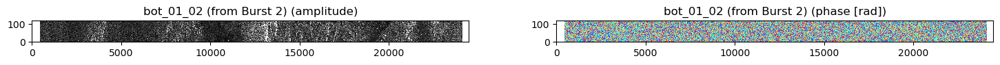

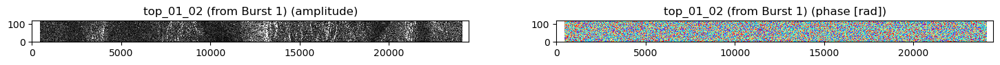

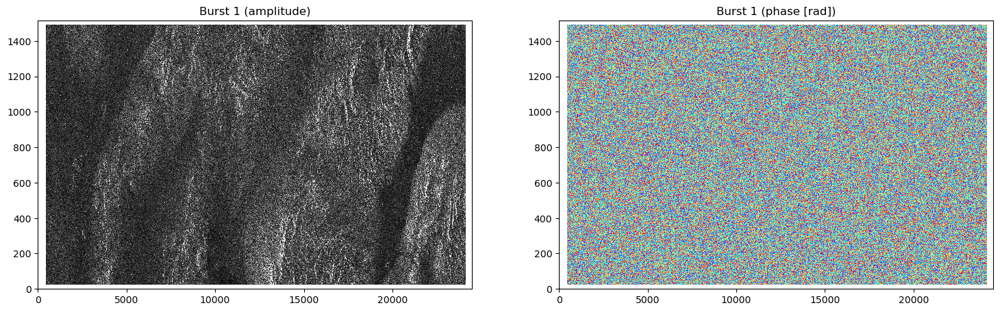

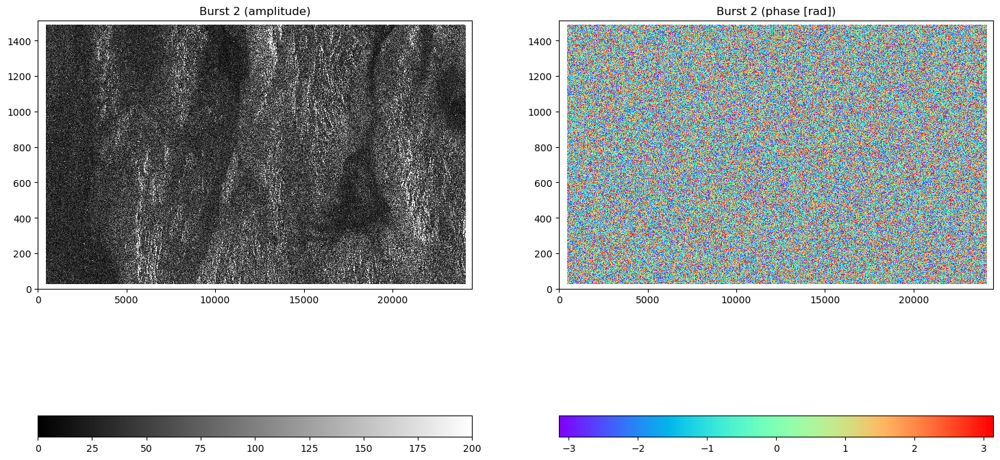

In [27]:
plotcomplexdata('reference/overlaps/IW3/burst_bot_01_02.slc.vrt',
                title='bot_01_02 (from Burst 2)',
                aspect=10, datamin=0, datamax=200)
plotcomplexdata('reference/overlaps/IW3/burst_top_01_02.slc.vrt',
                title='top_01_02 (from Burst 1)',
                aspect=10, datamin=0, datamax=200)
plotcomplexdata('reference/IW3/burst_01.slc.vrt',
                title='Burst 1',
                aspect=10, datamin=0, datamax=200)
plotcomplexdata('reference/IW3/burst_02.slc.vrt',
                title='Burst 2', aspect=10,
                datamin=0,datamax=200,
                draw_colorbar=True,
                colorbar_orientation="horizontal")

#### 3.4.2 Paso coarseoffsets

Se puede realizar un corregistro aproximado utilizando solo las órbitas. Esto también se conoce como corregistro geométrico. Como la ESD se aplica en la región de superposición de ráfagas, no es necesario aplicar este paso de estimación de **coarseoffsets** al SLC completo. En cambio, estimamos el desplazamiento aproximado para cada superposición de ráfaga como se identificó en el paso anterior.

In [34]:
# Uncomment to run this step only
# !python $ISCE_HOME/applications/topsApp.py --dostep=coarseoffsets

Como salida, esto genera una carpeta "*coarse_offsets/overlaps*", dentro de la cual hay un desglose de subsegmentos (*IW*) que contiene píxel por píxel de azimut (*azimut_[arriba, abajo]_XX_YY.off*) y rango de desplazamientos ( *range_[top,bot]_XX_YY.off*) para cada superposición de ráfagas.

In [28]:
ls coarse_offsets/overlaps/IW3/*

coarse_offsets/overlaps/IW3/azimuth_bot_01_02.off
coarse_offsets/overlaps/IW3/azimuth_bot_01_02.off.vrt
coarse_offsets/overlaps/IW3/azimuth_bot_01_02.off.xml
coarse_offsets/overlaps/IW3/azimuth_bot_02_03.off
coarse_offsets/overlaps/IW3/azimuth_bot_02_03.off.vrt
coarse_offsets/overlaps/IW3/azimuth_bot_02_03.off.xml
coarse_offsets/overlaps/IW3/azimuth_bot_03_04.off
coarse_offsets/overlaps/IW3/azimuth_bot_03_04.off.vrt
coarse_offsets/overlaps/IW3/azimuth_bot_03_04.off.xml
coarse_offsets/overlaps/IW3/azimuth_top_01_02.off
coarse_offsets/overlaps/IW3/azimuth_top_01_02.off.vrt
coarse_offsets/overlaps/IW3/azimuth_top_01_02.off.xml
coarse_offsets/overlaps/IW3/azimuth_top_02_03.off
coarse_offsets/overlaps/IW3/azimuth_top_02_03.off.vrt
coarse_offsets/overlaps/IW3/azimuth_top_02_03.off.xml
coarse_offsets/overlaps/IW3/azimuth_top_03_04.off
coarse_offsets/overlaps/IW3/azimuth_top_03_04.off.vrt
coarse_offsets/overlaps/IW3/azimuth_top_03_04.off.xml
coarse_offsets/overlaps/IW3/range_bot_01_02.off
coar

Grafiquemos el desplazamiento de azimut promedio para la superposición de ráfagas: bot_01_02

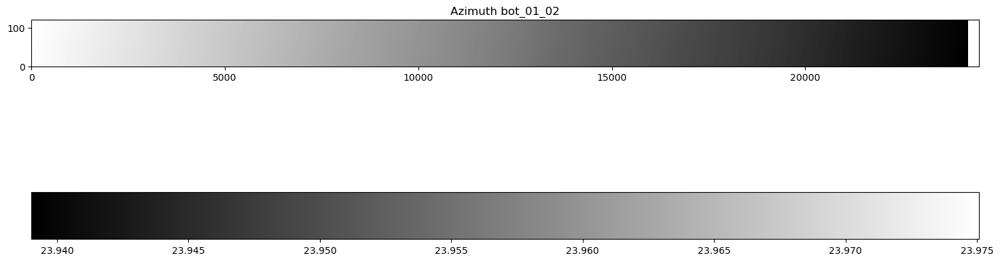

Driver: VRT/Virtual Raster
Files: coarse_offsets/overlaps/IW3/range_bot_01_02.off.vrt
       coarse_offsets/overlaps/IW3/range_bot_01_02.off
Size is 24492, 120
Corner Coordinates:
Upper Left  (    0.0,    0.0)
Lower Left  (    0.0,  120.0)
Upper Right (24492.0,    0.0)
Lower Right (24492.0,  120.0)
Center      (12246.0,   60.0)
Band 1 Block=24492x1 Type=Float32, ColorInterp=Undefined
  Minimum=-999999.000, Maximum=-57.587, Mean=-13694.205, StdDev=115972.198
  Metadata:
    STATISTICS_MAXIMUM=-57.587261199951
    STATISTICS_MEAN=-13694.204622007
    STATISTICS_MINIMUM=-999999
    STATISTICS_STDDEV=115972.19833349
    STATISTICS_VALID_PERCENT=100


In [29]:
plotdata('coarse_offsets/overlaps/IW3/azimuth_bot_01_02.off.vrt', band=1,
         title='Azimuth bot_01_02', colormap='gray', aspect=10,
         nodata=-999999.)
!gdalinfo -stats coarse_offsets/overlaps/IW3/range_bot_01_02.off.vrt

Ahora haga lo mismo para el desplazamiento de rango.

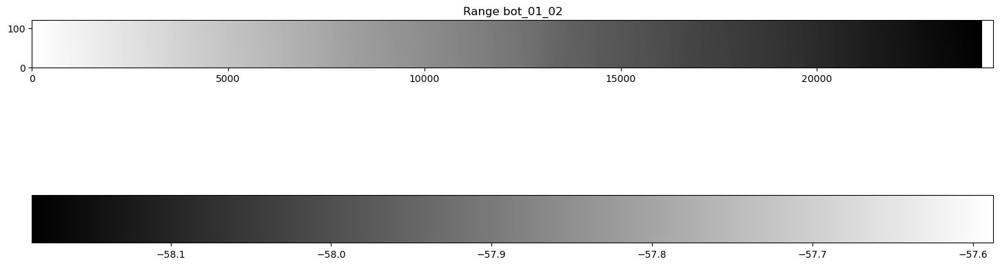

Driver: VRT/Virtual Raster
Files: coarse_offsets/overlaps/IW3/range_bot_01_02.off.vrt
       coarse_offsets/overlaps/IW3/range_bot_01_02.off
Size is 24492, 120
Corner Coordinates:
Upper Left  (    0.0,    0.0)
Lower Left  (    0.0,  120.0)
Upper Right (24492.0,    0.0)
Lower Right (24492.0,  120.0)
Center      (12246.0,   60.0)
Band 1 Block=24492x1 Type=Float32, ColorInterp=Undefined
  Min=-999999.000 Max=-57.587 
  Minimum=-999999.000, Maximum=-57.587, Mean=-13694.205, StdDev=115972.198
  Metadata:
    STATISTICS_MAXIMUM=-57.587261199951
    STATISTICS_MEAN=-13694.204622007
    STATISTICS_MINIMUM=-999999
    STATISTICS_STDDEV=115972.19833349
    STATISTICS_VALID_PERCENT=100


In [30]:
plotdata('coarse_offsets/overlaps/IW3/range_bot_01_02.off.vrt', band=1,
         title='Range bot_01_02', colormap='gray', aspect=10,
         nodata=-999999)
!gdalinfo -stats coarse_offsets/overlaps/IW3/range_bot_01_02.off.vrt


#### 3.4.3 Paso coarseresamp

Tanto la referencia como la secundaria deben tener una geometría común antes de la formación del interferograma. En este paso, tomaremos los resultados de la estimación de compensación gruesa y volveremos a muestrear las superposiciones de ráfagas secundarias en la geometría de referencia.

In [38]:
# Uncomment to run this step only
# !python $ISCE_HOME/applications/topsApp.py --dostep=coarseresamp

El resultado de este paso se almacena en la carpeta "*coarse_coreg/overlaps/*" para cada subsegmento.

In [31]:
ls coarse_coreg/overlaps/IW3/*

coarse_coreg/overlaps/IW3/burst_bot_01_02.slc
coarse_coreg/overlaps/IW3/burst_bot_01_02.slc.vrt
coarse_coreg/overlaps/IW3/burst_bot_01_02.slc.xml
coarse_coreg/overlaps/IW3/burst_bot_02_03.slc
coarse_coreg/overlaps/IW3/burst_bot_02_03.slc.vrt
coarse_coreg/overlaps/IW3/burst_bot_02_03.slc.xml
coarse_coreg/overlaps/IW3/burst_bot_03_04.slc
coarse_coreg/overlaps/IW3/burst_bot_03_04.slc.vrt
coarse_coreg/overlaps/IW3/burst_bot_03_04.slc.xml
coarse_coreg/overlaps/IW3/burst_top_01_02.slc
coarse_coreg/overlaps/IW3/burst_top_01_02.slc.vrt
coarse_coreg/overlaps/IW3/burst_top_01_02.slc.xml
coarse_coreg/overlaps/IW3/burst_top_02_03.slc
coarse_coreg/overlaps/IW3/burst_top_02_03.slc.vrt
coarse_coreg/overlaps/IW3/burst_top_02_03.slc.xml
coarse_coreg/overlaps/IW3/burst_top_03_04.slc
coarse_coreg/overlaps/IW3/burst_top_03_04.slc.vrt
coarse_coreg/overlaps/IW3/burst_top_03_04.slc.xml


#### 3.4.4 Paso overlapifg

Ahora que los SLC de superposición de ráfaga de referencia y secundaria están en la misma geometría, podemos calcular el interferograma entre la referencia y la secundaria. Como hay un conjunto superior e inferior de SLC, habrá dos interferogramas para cada superposición de ráfaga:
$$\Delta\Phi_{\text{bot}}  = \Phi_{\text{bot}}^{\text{ref}}*conj\left( \Phi_{\text{bot}}^{\text{sec}}\right) $$
$$\Delta\Phi_{\text{top}}  = \Phi_{\text{top}}^{\text{ref}}*conj\left( \Phi_{\text{top}}^{\text{sec}}\right) $$

In [32]:
# Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=overlapifg

Como salida, esto genera una carpeta "*coarse_interferogram/overlaps*", con un desglose de subsegmentos (*IW*) que contiene los interferogramas (*burst_[top,bot]_XX_YY.int*) e interferogramas de aspecto múltiple (*burst_[ top,bot]_XX_YY.7alks_19rlks.int*) para cada superposición de ráfagas.

In [33]:
ls coarse_interferogram/overlaps/IW3*

burst_bot_01_02.3alks_7rlks.int      burst_top_01_02.3alks_7rlks.int
burst_bot_01_02.3alks_7rlks.int.vrt  burst_top_01_02.3alks_7rlks.int.vrt
burst_bot_01_02.3alks_7rlks.int.xml  burst_top_01_02.3alks_7rlks.int.xml
burst_bot_01_02.int                  burst_top_01_02.int
burst_bot_01_02.int.vrt              burst_top_01_02.int.vrt
burst_bot_01_02.int.xml              burst_top_01_02.int.xml
burst_bot_02_03.3alks_7rlks.int      burst_top_02_03.3alks_7rlks.int
burst_bot_02_03.3alks_7rlks.int.vrt  burst_top_02_03.3alks_7rlks.int.vrt
burst_bot_02_03.3alks_7rlks.int.xml  burst_top_02_03.3alks_7rlks.int.xml
burst_bot_02_03.int                  burst_top_02_03.int
burst_bot_02_03.int.vrt              burst_top_02_03.int.vrt
burst_bot_02_03.int.xml              burst_top_02_03.int.xml
burst_bot_03_04.3alks_7rlks.int      burst_top_03_04.3alks_7rlks.int
burst_bot_03_04.3alks_7rlks.int.vrt  burst_top_03_04.3alks_7rlks.int.vrt
burst_bot_03_04.3alks_7rlks.int.xml  burst_top_03_04.3alks_7rlks.int.x

Tracemos juntos todos los interferogramas de aspecto múltiple para las superposiciones de "ráfaga superior".

['coarse_interferogram/overlaps/IW3/burst_top_01_02.3alks_7rlks.int', 'coarse_interferogram/overlaps/IW3/burst_top_02_03.3alks_7rlks.int', 'coarse_interferogram/overlaps/IW3/burst_top_03_04.3alks_7rlks.int']


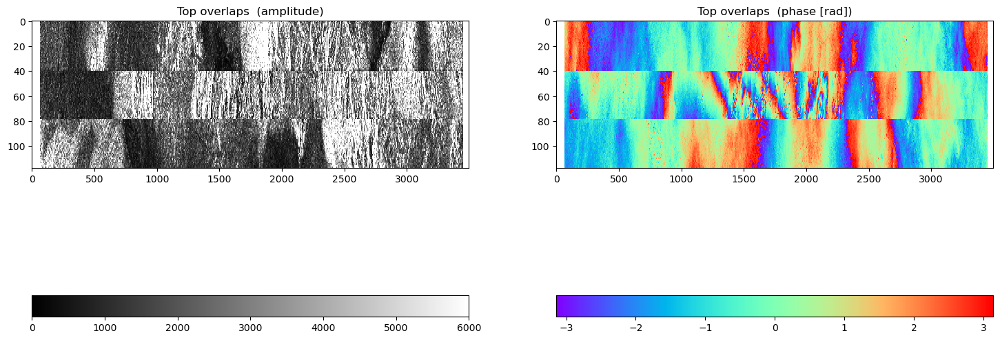

In [34]:
plotstackcomplexdata('coarse_interferogram/overlaps/IW3/burst_top_*.3alks_7rlks.int',
                     title="Top overlaps ", aspect=10, datamin=0, datamax=6000,
                     draw_colorbar=True, colorbar_orientation="horizontal")

Como puede ver, hay una gran tasa de franjas en los interferogramas, especialmente hacia el centro de nuestra área de estudio. ¿Tiene alguna idea de por qué esto podría ser?

#### 3.4.5 Paso prepesd

Ahora que se han calculado los interferogramas inferior y superior, se puede calcular el interferograma de doble diferencia, este procedimiento también se conoce como diversidad espectral:
$$\Delta\Phi_{\text{ESD}} = \Delta\Phi_{\text{bot}}*conj\left(\Delta\Phi_{\text{top}}\right)$$

In [43]:
#Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=prepesd

Como salida, esto genera una carpeta "*ESD*", con los interferogramas (*overlap_[IW?]_XX.int*) e interferogramas de aspecto múltiple (*overlap_[IW?]_XX.5alks_15rlks.int*) para cada superposición de ráfagas *XX*.

#### 3.4.6 Paso esd

El interferograma de doble diferencia solo captura desplazamientos en la dirección del azimut. Durante el paso **esd**, la fase del interferograma de doble diferencia para cada superposición de ráfagas se convierte en desplazamientos de píxeles utilizando la frecuencia de azimut y la diferencia de la frecuencia del centroide Doppler entre la geometría hacia adelante y hacia atrás.

$$ \text{offset}_{\text{azimuth}}= \frac{f_{\text{azimuth}}}{2\pi} \frac{\text{arg}\left[e^{ j\Delta\Phi_{\text{ESD}}} \right]}{\Delta f_{\text{DC}}^{\text{overlap}}}$$

Una vez completadas, todas las compensaciones se combinan y la media de la distribución se toma como la compensación de corregistro de azimut. Tenga en cuenta que solo se consideran aquellos píxeles con una coherencia superior a 0,85.

<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
La coherencia es demasiado mala para encontrar un punto confiable para estimar el umbral de ESD. Elija una de las siguientes dos opciones que se enumeran a continuación.
</div>
<br>
<div class="alert alert-warning">
<b>Umbral ESD:</b>
El usuario puede cambiar el umbral de coherencia ESD en **topsApp.xml** mediante la propiedad **ESD coherence threshold**. Se recomienda no bajar de 0,7.
</div>
<br>
<div class="alert alert-warning">
<b>SALTAR ESD:</b>
En caso de que no desee realizar ESD, p. la coherencia es demasiado mala en las regiones superpuestas, puede optar por omitir ESD y solo usar la información de la órbita. Esto se controla a través de **topsApp.xml** con la propiedad **do ESD**.
</div>

In [44]:
# Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=esd

Al completar el paso **esd**, verá que los archivos *combined_*\**[.cor,.int,freq.bin]* y una figura *ESDmisregistration.jpg* se han agregado a la carpeta *ESD*.

In [35]:
ls ESD/combined* ESD/ESDmisregistration*

ESD/ESDmisregistration.png     ESD/combined_IW3.off
ESD/combined_IW3.cor           ESD/combined_IW3.off.vrt
ESD/combined_IW3.cor.vrt       ESD/combined_IW3.off.xml
ESD/combined_IW3.cor.xml       ESD/combined_freq_IW3.bin
ESD/combined_IW3.int           ESD/combined_freq_IW3.bin.vrt
ESD/combined_IW3.int.vrt       ESD/combined_freq_IW3.bin.xml
ESD/combined_IW3.int.xml


Los archivos combinados de coherencia e interferograma se utilizan como entrada para la estimación del desplazamiento de azimut de ESD:

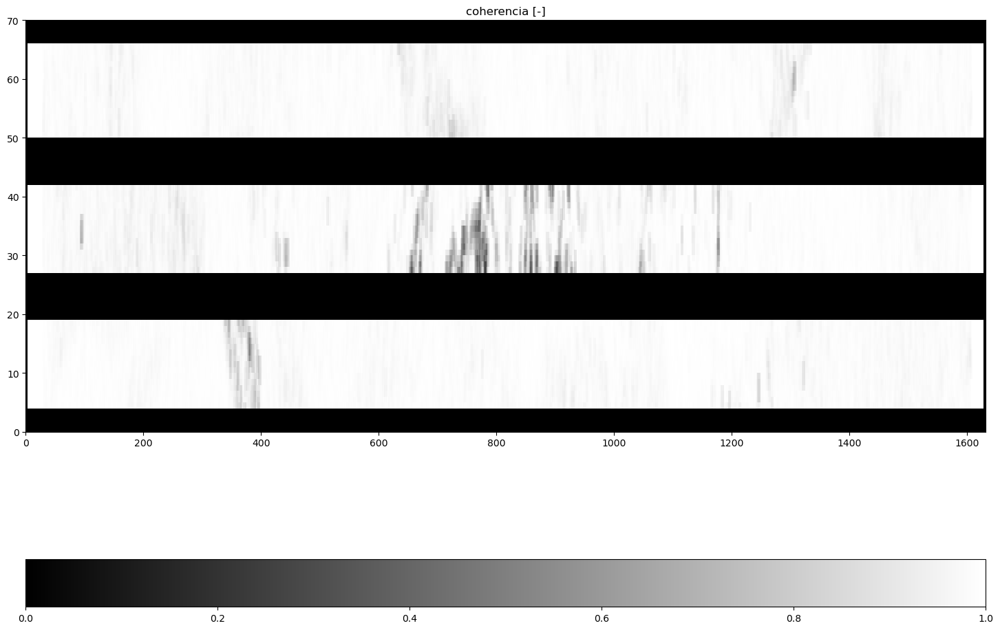

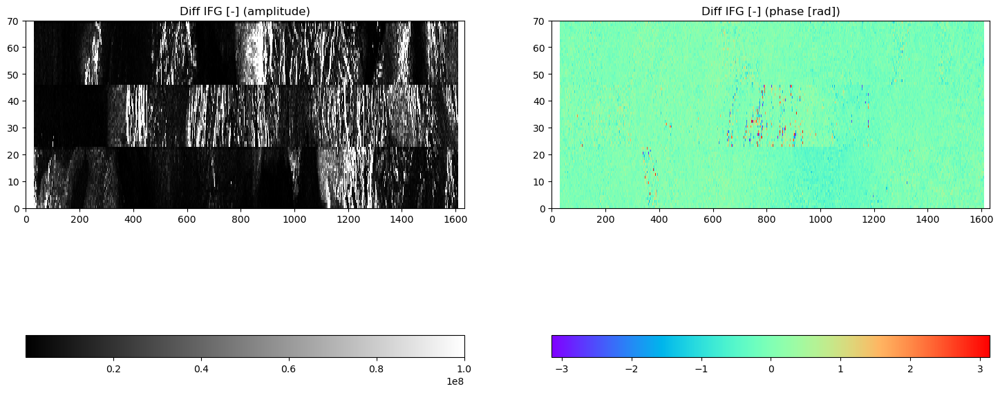

In [36]:
# Plot ESD coherence
plotdata('ESD/combined_IW3.cor', band=1,
         title="coherencia [-]", aspect=10,
         datamin=0, datamax=1, background='yes')

# Plot double difference interferogram
plotcomplexdata('ESD/combined_IW3.int',
                title="Diff IFG [-]", aspect=10,
                datamin=100000, datamax=100000000,
                draw_colorbar=True)

En general, se puede observar una alta coherencia (> 0,85) y, por lo tanto, la mayoría de los píxeles se utilizarán en la generación del histograma de ESD. El interferograma muestra un fuerte movimiento azimutal en la ubicación del terremoto. Lejos del terremoto, el impacto es menor, mostrando en promedio ~0 rad de fase azimutal. Investiguemos si esto potencialmente ha sesgado la estimación de ESD al inspeccionar la figura del historgrama que se creó como parte del paso **esd**:

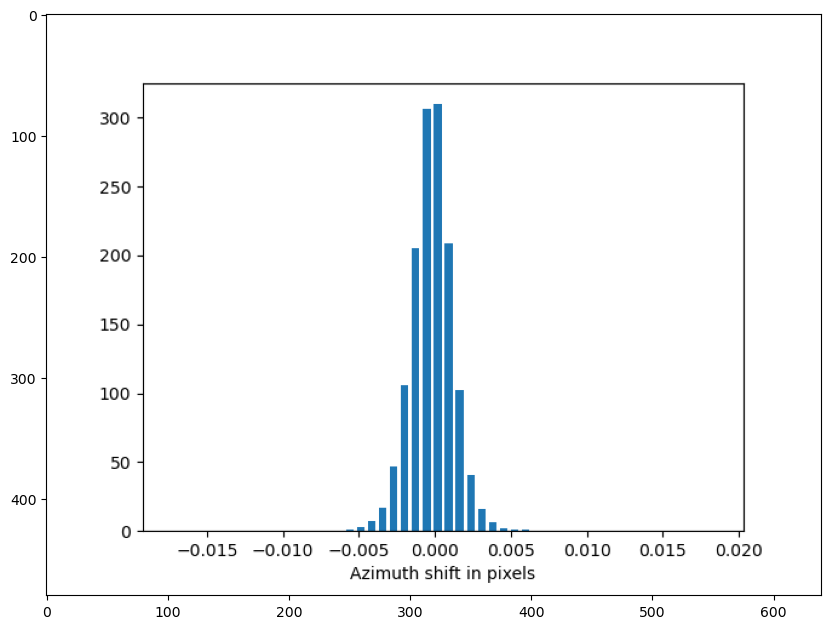

In [37]:
import matplotlib.image as mpimg
img= mpimg.imread("ESD/ESDmisregistration.png")
fig = plt.figure(figsize=(10, 11))
plt.imshow(img);

<div class="alert alert-warning">
<b>CONSEJO:</b>
Siempre es bueno inspeccionar las entradas del cálculo de ESD, ya que existen fuentes como la ionosfera y la deformación tectónica que pueden causar un cambio azimutal aparente, lo que podría sesgar la media de la estimación de ESD.
</div>

### 3.5 Paso rangecoreg

En el siguiente paso, estimaremos el desplazamiento en la dirección del rango haciendo una correlación cruzada de amplitud entre las superposiciones de ráfaga de referencia y secundaria. En cuanto a las compensaciones de azimuth, se usa un histograma de la compensación de rango para estimar la compensación de rango media para el SLC completo. Tenga en cuenta que solo se consideran los píxeles con una SNR de 8 o superior.

In [2]:
# vamos con "cd" a este directorio donde se realizará el procesamiento.
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --dostep=rangecoreg

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-20 23:46:33,176 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step rangecoreg
GDAL open (R): reference/overlaps/IW3/burst_top_01_02.slc.vrt
GDAL open (R): coarse_coreg/overlaps/IW3/burst_top_01_02.slc.vrt
Scale Factor in Range:  1.0
Scale Factor in Azimuth:  1.0
Skip Sample Down: 4
Skip Sample Across: 571
 Input Bands:            1           1
  XXX start timer
 wisdomFile, leng

Visualicemos los resultados:

In [3]:
ls ESD

ESDmisregistration.png               freq_IW3_03.bin.xml
combined_IW3.cor                     overlap_IW3_01.5alks_15rlks.cor
combined_IW3.cor.vrt                 overlap_IW3_01.5alks_15rlks.cor.vrt
combined_IW3.cor.xml                 overlap_IW3_01.5alks_15rlks.cor.xml
combined_IW3.int                     overlap_IW3_01.5alks_15rlks.int
combined_IW3.int.vrt                 overlap_IW3_01.5alks_15rlks.int.vrt
combined_IW3.int.xml                 overlap_IW3_01.5alks_15rlks.int.xml
combined_IW3.off                     overlap_IW3_01.int
combined_IW3.off.vrt                 overlap_IW3_01.int.vrt
combined_IW3.off.xml                 overlap_IW3_01.int.xml
combined_freq_IW3.bin                overlap_IW3_02.5alks_15rlks.cor
combined_freq_IW3.bin.vrt            overlap_IW3_02.5alks_15rlks.cor.vrt
combined_freq_IW3.bin.xml            overlap_IW3_02.5alks_15rlks.cor.xml
freq_IW3_01.5alks_15rlks.bin         overlap_IW3_02.5alks_15rlks.int
freq_IW3_01.5alks_15rlks.bin.vrt     overlap_IW3_02.5

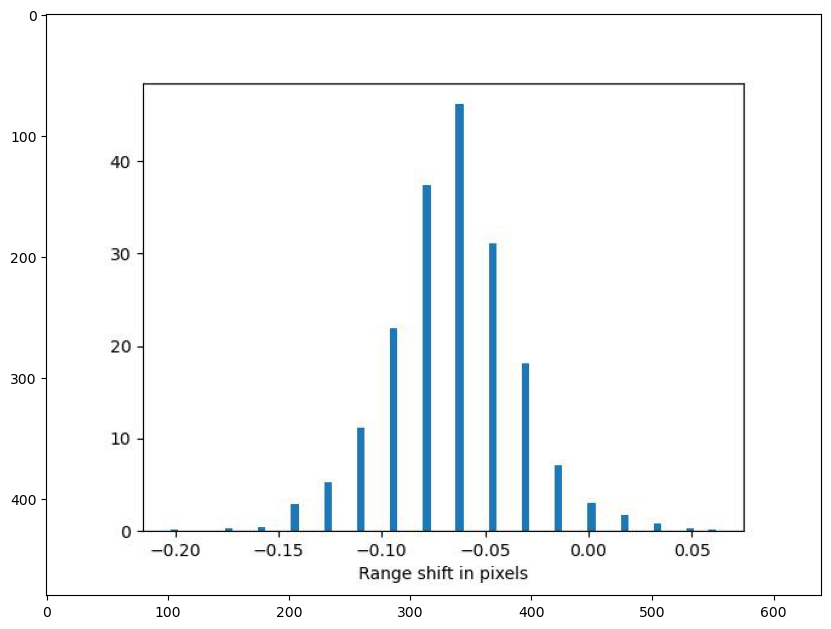

In [4]:
import matplotlib.image as mpimg
img= mpimg.imread("ESD/rangeMisregistration.jpg")
fig = plt.figure(figsize=(10, 11))
plt.imshow(img);

### 3.6 Ráfagas corregistradas

In [2]:
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --start=fineoffsets --end=fineresamp

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-21 09:10:16,651 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step fineoffsets
2022-10-21 09:10:16,797 - isce.topsinsar.fineoffsets - INFO - IW3 - Burst 0 of reference matched with Burst 0 of secondary
GDAL open (R): geom_reference/IW3/lat_01.rdr.vrt
GDAL open (R): geom_reference/IW3/lon_01.rdr.vrt
GDAL open (R): geom_reference/IW3/hgt_01.rdr.vrt
2022-10-21 09:10:16,814 - isce.t

#### 3.6.1 Paso fineoffsets

Ahora que hemos estimado las compensaciones de rango y azimuth usando las regiones de superposición de ráfagas, las aplicaremos a las ráfagas completas en el paso de **fineoffsets**.

In [52]:
# Uncomment to run only this step
# !python $ISCE_HOME/applications/topsApp.py --dostep=fineoffsets

La salida se almacena en la carpeta *fine_offsets* para cada subsegmento, con un archivo de compensación de acimut (*azimuth_XX.off*) y un archivo de compensación de rango (*range_XX.off*) para cada ráfaga *XX*.

In [3]:
ls fine_offsets/*

azimuth_01.off      azimuth_03.off      range_01.off        range_03.off
azimuth_01.off.vrt  azimuth_03.off.vrt  range_01.off.vrt    range_03.off.vrt
azimuth_01.off.xml  azimuth_03.off.xml  range_01.off.xml    range_03.off.xml
azimuth_02.off      azimuth_04.off      range_02.off        range_04.off
azimuth_02.off.vrt  azimuth_04.off.vrt  range_02.off.vrt    range_04.off.vrt
azimuth_02.off.xml  azimuth_04.off.xml  range_02.off.xml    range_04.off.xml


#### 3.6.2 Paso fineresamp

Los archivos de desplazamiento fino de ráfaga recién creados se utilizan para volver a muestrear los SLC de ráfaga secundarios en la geometría de referencia mediante el paso **fineresamp**.

In [54]:
#Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=fineresamp

La salida se almacena en la carpeta *coreg_fine* para cada subsegmento, que contiene los SLC de ráfaga secundaria remuestreados (*burst_XX.slc*).

### 3.7 Pantalla de fase ionosférica

En este tutorial, vamos a omitir este paso. Alentamos a los estudiantes a leer sobre este paso y configurar los parámetros apropiados en **topsApp.xml** para ejercer esta opción. De forma predeterminada, no se realiza ninguna corrección de ionosfera. Así que este paso es un paso a través de este ejercicio.

In [4]:
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --dostep=ion

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-21 09:20:57,928 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step ion
Dumping the application's pickle object _insar to file  PICKLE/ion
The remaining steps are (in order):  ['burstifg', 'mergebursts', 'filter', 'unwrap', 'unwrap2stage', 'geocode', 'denseoffsets', 'filteroffsets', 'geocodeoffsets']


### 3.8 Generación de interferograma

In [5]:
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --start=burstifg --end=filter

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-21 09:21:14,562 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step burstifg
GDAL open (R): fine_interferogram/IW3/burst_01.int.vrt
API open (WR): fine_interferogram/IW3/burst_01.3alks_7rlks.int
GDAL close: fine_interferogram/IW3/burst_01.int.vrt
API close:  fine_interferogram/IW3/burst_01.3alks_7rlks.int
API open (R): fine_interferogram/IW3/burst_01.3alks_7rlks.int
API close:  f

#### 3.8.1 Paso burstifg

Los SLC de las ráfagas secundarias y de referencia tienen ahora una geometría común y se pueden calcular interferogramas para cada ráfaga. Haremos esto como parte del paso **burstifg**.

In [57]:
#Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=burstifg

Este paso genera una carpeta "*fine_interferogram*", dentro de la cual se encuentra un desglose de subsegmentos (*IW*), cada uno de los cuales contiene sus respectivos interferogramas (*burst_XX.int*), la coherencia (*burst_XX.cor*) y los interferogramas de aspecto múltiple. (*burst_XX.3alks_7rlks.int*) por cada ráfaga *XX*.

In [6]:
ls fine_interferogram/*

fine_interferogram/IW3.xml

fine_interferogram/IW3:
burst_01.3alks_7rlks.int      burst_03.3alks_7rlks.int
burst_01.3alks_7rlks.int.vrt  burst_03.3alks_7rlks.int.vrt
burst_01.3alks_7rlks.int.xml  burst_03.3alks_7rlks.int.xml
burst_01.cor                  burst_03.cor
burst_01.cor.vrt              burst_03.cor.vrt
burst_01.cor.xml              burst_03.cor.xml
burst_01.int                  burst_03.int
burst_01.int.vrt              burst_03.int.vrt
burst_01.int.xml              burst_03.int.xml
burst_02.3alks_7rlks.int      burst_04.3alks_7rlks.int
burst_02.3alks_7rlks.int.vrt  burst_04.3alks_7rlks.int.vrt
burst_02.3alks_7rlks.int.xml  burst_04.3alks_7rlks.int.xml
burst_02.cor                  burst_04.cor
burst_02.cor.vrt              burst_04.cor.vrt
burst_02.cor.xml              burst_04.cor.xml
burst_02.int                  burst_04.int
burst_02.int.vrt              burst_04.int.vrt
burst_02.int.xml              burst_04.int.xml


Aquí hay un gráfico de uno de los interferogramas de ráfaga:

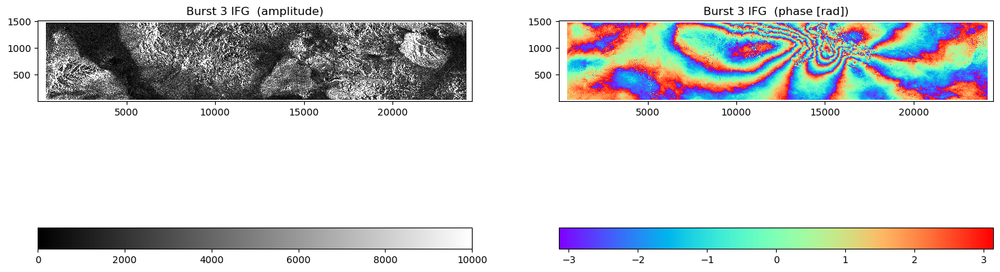

In [7]:
plotcomplexdata('fine_interferogram/IW3/burst_03.3alks_7rlks.int.vrt', 
                title="Burst 3 IFG ", aspect=3, datamin=0, datamax=10000,
                draw_colorbar=True)

#### 3.8.2 Paso mergebursts

Como puede ver en la figura, es difícil capturar la extensión total de la deformación del terremoto a partir de una ráfaga. En el paso **mergebursts**, combinaremos las diferentes ráfagas para generar un producto combinado.

In [61]:
#Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=mergebursts

La salida se escribe en la carpeta "*merged*". Esta carpeta contiene el interferograma fusionado (**topophase.flat**), la coherencia (**topophase.cor**), los ángulos de la línea de visión (LOS) (**los.rdr**), las alturas (**z.rdr**), la longitud (**lon.rdr**) y la información de latitud (**lat.rdr**). Estos archivos tienen varias vistas, mientras que los archivos con el sufijo *.full* se refieren a los datos de resolución completa. También puede encontrar un SLC fusionado para la referencia (**reference.slc.full.vrt**) y el secundario (**reference.slc.full.vrt**). Estos archivos se generan si la propiedad **do denseoffsets** se establece en *True* en **topsApp.xml**. Puede usar *gdalinfo* para explorar el formato de estos archivos y el número de bandas.


Aquí hay una gráfica del intergerograma combinado:

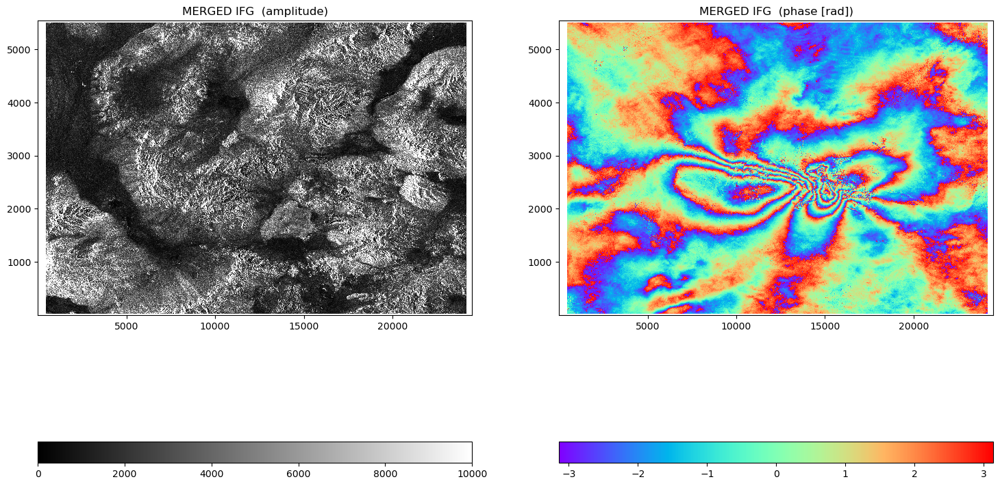

In [8]:
plotcomplexdata('merged/topophase.flat.vrt', 
                title="MERGED IFG ", aspect=3,
                datamin=0, datamax=10000, draw_colorbar=True)

En este ejemplo particular, no parece haber discontinuidades obvias en la región del terremoto a lo largo de las ráfagas. Con otros terremotos, a menudo observamos una ligera desalineación de las ráfagas cerca de la ruptura. Es probable que esto sea introducido por la ionosfera o por la fuga de la deformación del azimuth del terremoto en el procedimiento de estimación de ESD. Se pueden explorar más a fondo dos posibles vías:

1. Además del umbral de ESD, enmascare los píxeles dentro de la región del terremoto. es decir, permita que la estimación de ESD sea descrita por el campo lejano.
2. Especifique no usar ESD en topsApp.xml. En su lugar, solo use la información de la órbita para fines de registro conjunto.

#### 3.8.3 Paso filter

Multilooking reduce el ruido, pero muchas veces es insuficiente para interpretar el interferograma o desenvolver. A menudo aplicamos filtros adicionales para mejorar la SNR.

In [63]:
# Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=filter

Las salidas del paso de filtrado se agregan a la carpeta fusionada, donde el interferograma filtrado se llama **filt_topophase.flat** y la coherencia filtrada **phsig.cor**. Tenga en cuenta que este último es diferente de la coherencia convencional: se basa en una estimación de la desviación estándar de la fase traducida de vuelta a la coherencia a través de la relación de límite de Cramer-Rao:

$$\gamma = \frac{1}{\sqrt{1+2N\sigma_\phi^2}}$$

Comparemos los interferogramas filtrados y sin filtrar:

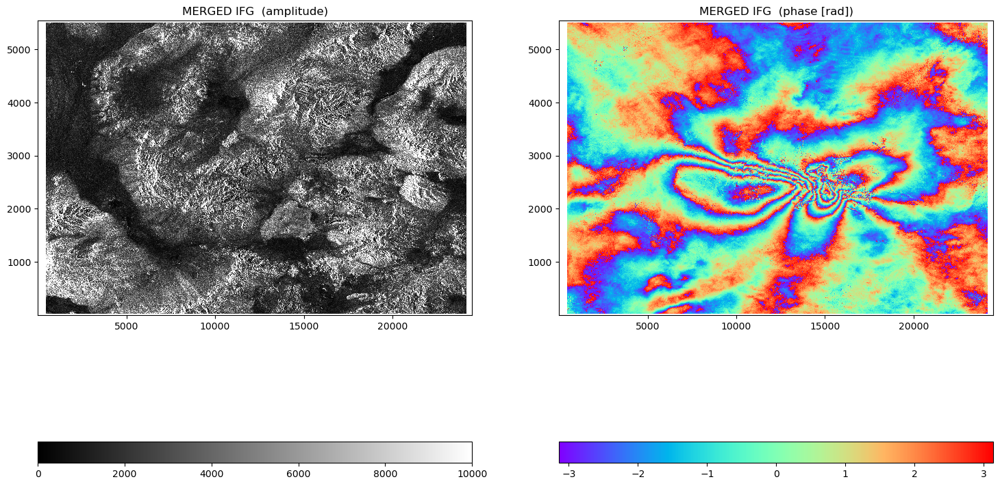

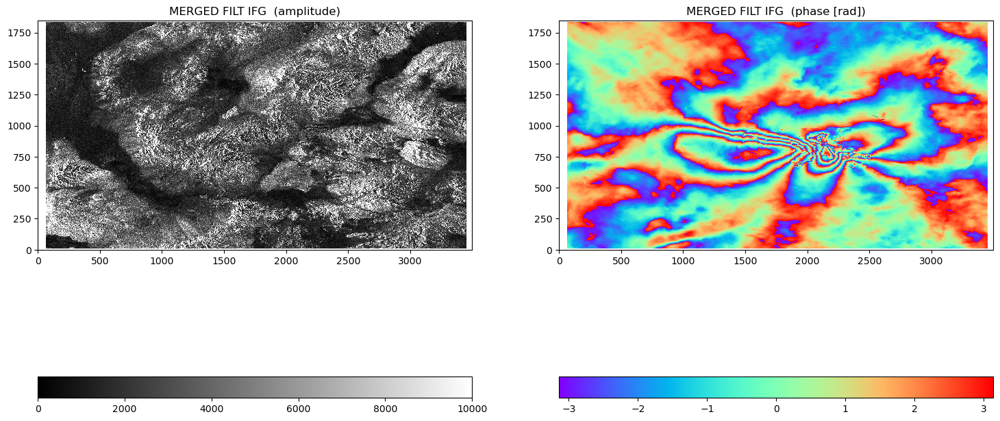

In [9]:
plotcomplexdata('merged/topophase.flat.vrt',
                title="MERGED IFG ", aspect=3,
                datamin=0, datamax=10000, draw_colorbar=True)
plotcomplexdata('merged/filt_topophase.flat.vrt', 
                title="MERGED FILT IFG ", aspect=1,
                datamin=0, datamax=10000, draw_colorbar=True)

<div class="alert alert-warning">
<b>FUERZA DEL FILTRO:</b>
La cantidad de filtrado se puede controlar a través de la propiedad **"intensidad del filtro"** en el archivo **topsApp.xml**.</div>
<div class="alert alert-danger">
<b>PROBLEMA POTENCIAL:</b>
Como usuario, puede cambiar la fuerza de filtrado. Se debe tener cuidado, ya que un interferograma más suave y limpio no implica necesariamente un mejor interferograma. Inspeccione siempre el interferograma antes y después del filtrado y evalúe si se introducen señales falsas o si las franjas densas se suavizan demasiado debido al filtrado excesivo. Mire cuidadosamente las regiones ruidosas, donde las franjas de las áreas coherentes "sangran" en las áreas ruidosas.
</div>


### 3.9 Desenvolvimiento de fase

In [24]:
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --start=unwrap --end=unwrap2stage

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-21 12:09:32,637 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step unwrap

snaphu v1.4.2
Reading wrapped phase from file merged/filt_topophase.flat
No weight file specified.  Assuming uniform weights
Reading correlation data from file merged/phsig.cor
Calculating smooth-solution cost parameters
Initializing flows with MCF algorithm
Integrating phase
Writing output to file merged

#### 3.9.1 Step unwrap

En el próximo paso usaremos **snaphu** para desenvolver el interferograma:

In [23]:
#Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=unwrap

no change     /Users/javjrg/opt/anaconda3/envs/isce2/condabin/conda
no change     /Users/javjrg/opt/anaconda3/envs/isce2/bin/conda
no change     /Users/javjrg/opt/anaconda3/envs/isce2/bin/conda-env
no change     /Users/javjrg/opt/anaconda3/envs/isce2/bin/activate
no change     /Users/javjrg/opt/anaconda3/envs/isce2/bin/deactivate
no change     /Users/javjrg/opt/anaconda3/envs/isce2/etc/profile.d/conda.sh
no change     /Users/javjrg/opt/anaconda3/envs/isce2/etc/fish/conf.d/conda.fish
no change     /Users/javjrg/opt/anaconda3/envs/isce2/shell/condabin/Conda.psm1
no change     /Users/javjrg/opt/anaconda3/envs/isce2/shell/condabin/conda-hook.ps1
no change     /Users/javjrg/opt/anaconda3/envs/isce2/lib/python3.9/site-packages/xontrib/conda.xsh
no change     /Users/javjrg/opt/anaconda3/envs/isce2/etc/profile.d/conda.csh
no change     /Users/javjrg/.bash_profile
No action taken.

CommandNotFoundError: Your shell has not been properly configured to use 'conda activate'.
To initialize your shel

La salida desenrollada se agrega a la carpeta "*merged*". El interferograma desenvuelto se encuentra en **filt_topophase.unw**. También encontrará los componentes conectados almacenados en **filt_topophase.conncomp**. Los trazamos a continuación e inspeccionamos los resultados en busca de posibles errores.

<div class="alert alert-warning">
<b>INSPECCIONE LA SALIDA DEL COMPONENTE CONECTADO:</b>
El archivo de componente conectado es una métrica del rendimiento de desempaquetado. Proporciona información sobre qué partes de la imagen sin envolver están conectadas. Las regiones con un componente conectado diferente pueden tener un salto de fase equivalente a un múltiplo de 2 $\pi$. Por lo tanto, es importante inspeccionar siempre la fase y la salida del componente conectado al mismo tiempo. </div>

<div class="alert alert-warning">
<b>NÚMEROS DE COMPONENTES CONECTADOS:</b>
El componente conectado 0 se refiere a aquellos píxeles que no se pueden desenvolver de manera confiable. Estos deben enmascararse antes de realizar cualquier tipo de modelado. Los otros componentes conectados se incrementan en 1 por región aislada.
</div>
<div class="alert alert-danger">
<b>EJEMPLO DE ERROR DE DESBLOQUEO:</b>
Para ver el resultado sin desenrollar con saltos de fase no físicos, ejecute el desenrollado "icu" cambiando la propiedad **unwrapper name** en **topsApp.xml** a *icu*. Tenga en cuenta que el nombre de archivo del componente conectado a la icu es **filt_topophase.conncomp**.
</div>


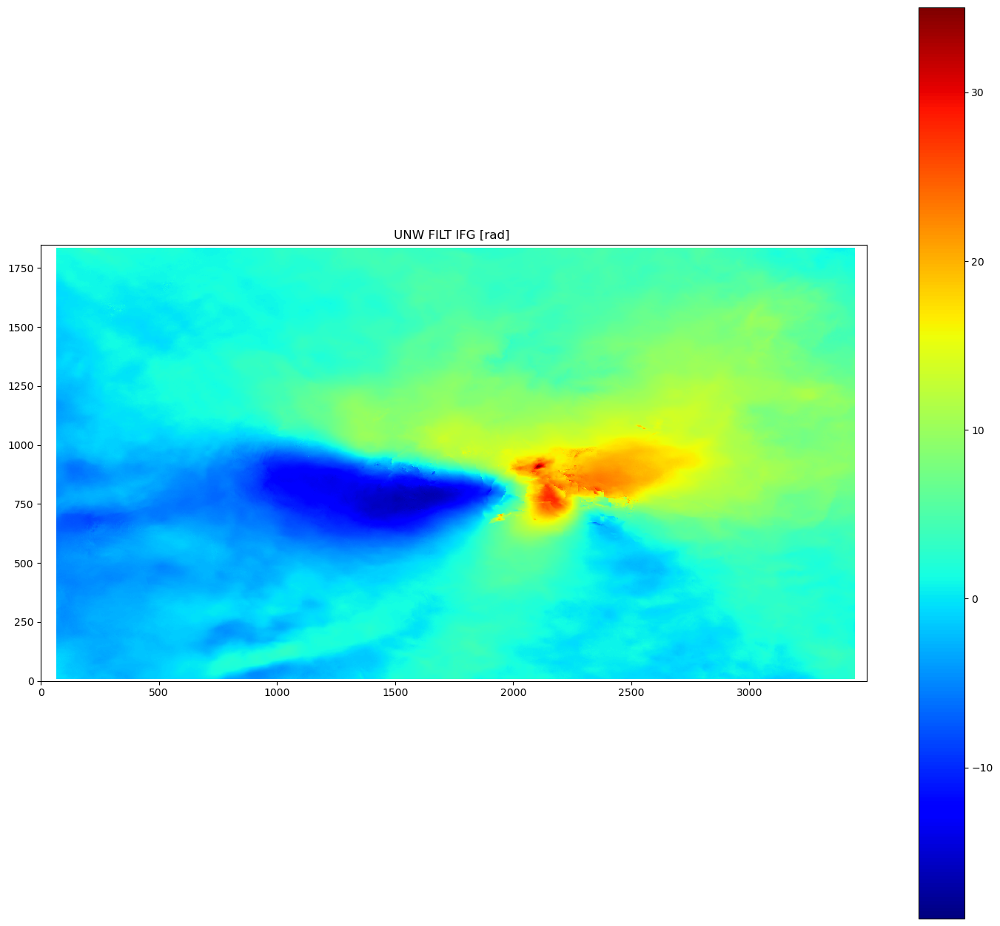

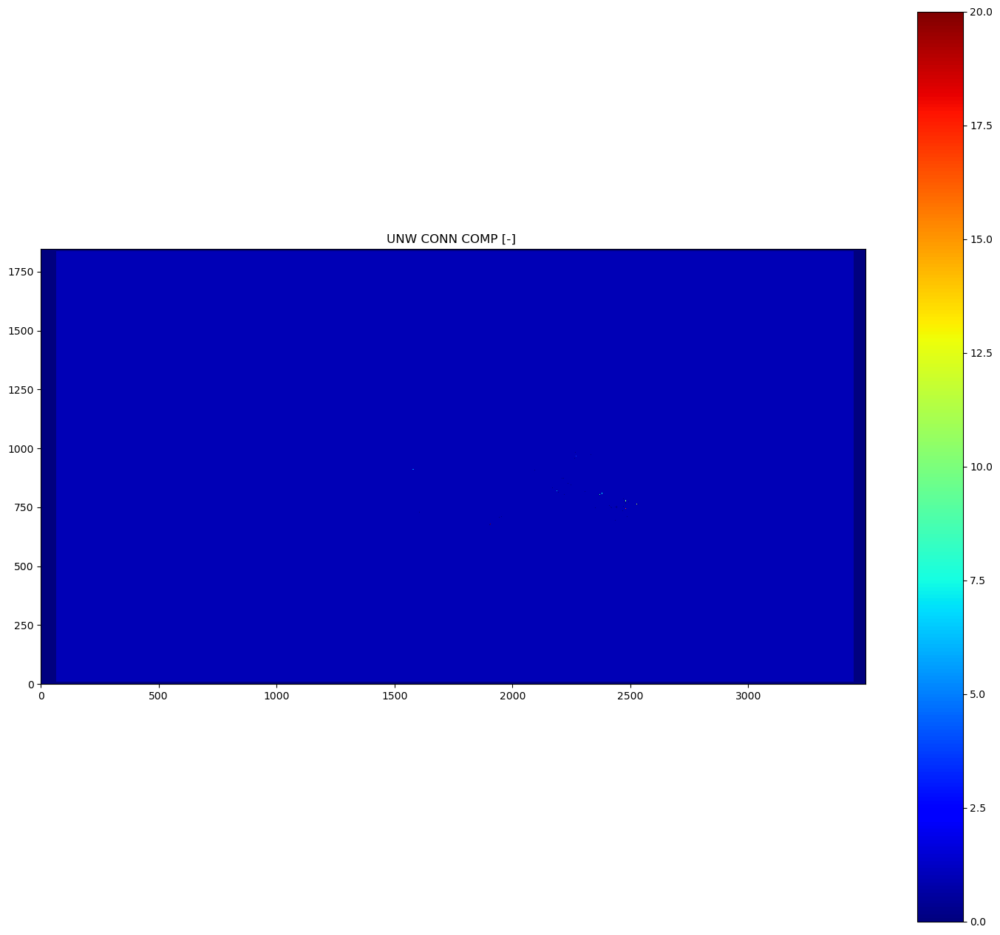

In [25]:
plotdata('merged/filt_topophase.unw', band=2,
         title="UNW FILT IFG [rad] ",
         colormap='jet', colorbar_orientation="vertical")

plotdata('merged/filt_topophase.unw.conncomp', band=1,
         title="UNW CONN COMP [-] ", colormap='jet',
         colorbar_orientation="vertical",
         nodata=0)

#### 3.9.2 Paso unwrap2stage

También hay un desenrollado de dos etapas donde las salidas del archivo de componente conectado se utilizan para ajustar el interferograma desempaquetado. Durante este procedimiento de optimización, se minimiza el desplazamiento de fase entre los límites de los componentes conectados. Este paso solo se puede ejecutar si el desenrollado se realizó con el desenrollador *snaphu_mcf* y también requiere que la propiedad **"do unwrap2stage"** se establezca en *True*. Ambos se controlan en topsApp.xml.

No habilitamos el desenrollado de dos etapas. El impacto debe ser pequeño dados solo los componentes conectados a pequeña escala. Por lo tanto, la ejecución de **unwrap2stage** se completará instantáneamente.

In [6]:
#Uncomment to run this step only
#!python $ISCE_HOME/applications/topsApp.py --dostep=unwrap2stage

### 3.10 Paso geocode

En el siguiente paso, **geocodificaremos** muchos de los productos de salida creados hasta este punto. Por defecto, `topsApp.py` geocodifica los siguientes archivos: **filt_topophase.flat**, **filt_topophase.unw**, **los.rdr**, **phsig.cor**, **topophase.cor** y **topofase.plana**. El usuario puede controlar qué archivos se geocodifican utilizando la propiedad **"geocode list"** en **topsApp.xml**.

In [26]:
os.chdir(insar_dir)
!python $ISCE_HOME/applications/topsApp.py --dostep=geocode

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce
2022-10-21 12:17:03,433 - isce.insar - INFO - ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
ISCE VERSION = 2.6.1, RELEASE_SVN_REVISION = ,RELEASE_DATE = 20220811, CURRENT_SVN_REVISION = 
Step processing
Running step geocode
2022-10-21 12:17:03,480 - isce.topsinsar.runGeocode - INFO - Geocoding Image
Number of products to geocode:  6
Output:  merged/phsig.cor.geo
API open (WR): merged/dem.crop
API open (WR): merged/phsig.cor.geo
GDAL open (R): merged/phsig.cor.vrt
GDAL open (R): demLat_N37_N39_Lon_W119_W117.dem.wgs84.vrt
 Usi

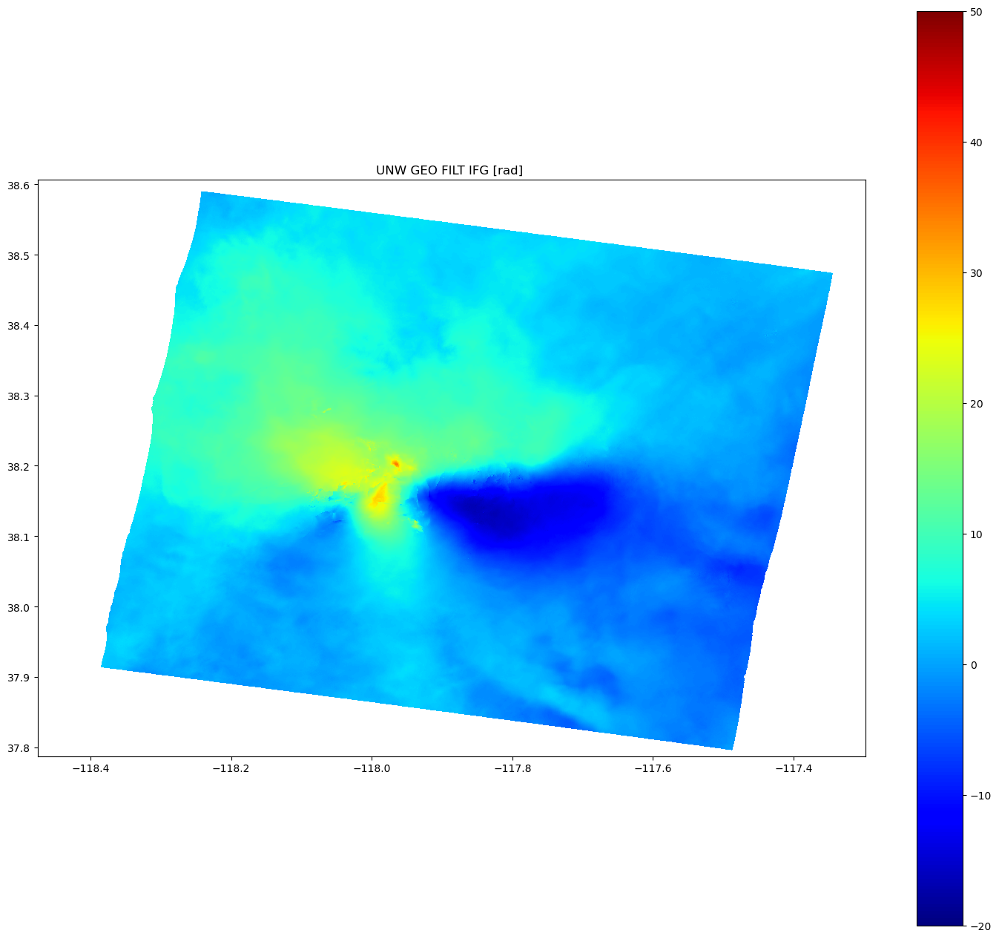

In [29]:
plotdata('merged/filt_topophase.unw.geo', band=2,
         title="UNW GEO FILT IFG [rad] ", colormap='jet',
         colorbar_orientation="vertical", datamin=-20, datamax=50)

# Relevant references:
- Heresh Fattahi, Piyush Agram, and Mark Simons, *Precise coregistration of Sentinel-1A TOPS data*, https://files.scec.org/s3fs-public/0129_1400_1530_Fattahi.pdf
- Fattahi, H., Agram, P. and Simons, M., 2016. A network-based enhanced spectral diversity approach for TOPS time-series analysis. IEEE Transactions on Geoscience and Remote Sensing, 55(2), pp.777-786. https://core.ac.uk/reader/77927508
- ESA, *Sentinel-1 and TOPS overview*, https://sentinel.esa.int/web/sentinel/user-guides/sentinel-1-sar
- Nestor Yague-Martinez, Pau Prats-Iraola, Fernando Rodriguez Gonzalez,Ramon Brcic, Robert Shau, Dirk Geudtner, Michael Eineder, and Richard Bamler, *Interferometric Processing of Sentinel-1 TOPS Data*, IEEE, doi:10.1109/TGRS.2015.2497902, https://ieeexplore.ieee.org/document/7390052/
- Liang, C., Agram, P., Simons, M. and Fielding, E.J., 2019. Ionospheric correction of insar time series analysis of c-band sentinel-1 tops data. IEEE Transactions on Geoscience and Remote Sensing, 57(9), pp.6755-6773. 